# IDS PROJECT-3
## GROUP - 5  
### PIYUSH GUPTA, ABHISHEK SINGH & TUSHAR SURVANA

## Import necessary libraries

In [1]:
# Importing Prophet, a forecasting tool developed by Facebook.
# It is designed for analyzing time-series that display patterns on different time scales such as yearly, weekly, daily, and hourly.
from prophet import Prophet

# Importing pandas, a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd

# Importing numpy, a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays.
import numpy as np

# Importing matplotlib.pyplot, a collection of command style functions that make Matplotlib work like MATLAB for creating and visualizing plots.
import matplotlib.pyplot as plt

# Importing Root Mean Squared Error (RMSE) from statsmodels, a statistical model to measure the average magnitude of the error.
from statsmodels.tools.eval_measures import rmse

# Importing Mean Absolute Error (MAE), a measure of errors between paired observations expressing the same phenomenon.
from sklearn.metrics import mean_absolute_error

# Importing R2 score, also known as the coefficient of determination, a statistical measure in regression analysis that determines the proportion of variance in the dependent variable that can be predicted from the independent variable.
from sklearn.metrics import r2_score

# Importing cross_validate from sklearn.model_selection, a function for cross-validation of the model.
from sklearn.model_selection import cross_validate

# Importing cross_val_score from sklearn.model_selection, a function to evaluate a score by cross-validation.
from sklearn.model_selection import cross_val_score

# Importing performance_metrics from prophet.diagnostics, a function to compute some useful statistics of the prediction performance (yhat, yhat_lower, yhat_upper, multiplicative).
from prophet.diagnostics import performance_metrics

# Importing cross_validation from prophet.diagnostics, a function for time series cross-validation.
from prophet.diagnostics import cross_validation

# Importing plot_cross_validation_metric from prophet.plot, a function to plot a performance metric vs. forecast horizon for cross-validated prediction performance.
from prophet.plot import plot_cross_validation_metric

# Importing plot_plotly, plot_components_plotly and plot_cross_validation_metric from prophet.plot, functions to make interactive plots with plotly.
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

In [2]:
# Load the data directly from the URL
url = "https://data.cityofnewyork.us/api/views/jr24-e7cr/rows.csv?accessType=DOWNLOAD"
df = pd.read_csv(url,low_memory=False)

In [3]:
# Display the column labels of the DataFrame
df.columns

Index(['Development Name', 'Borough', 'Account Name', 'Location', 'Meter AMR',
       'Meter Scope', 'TDS #', 'EDP', 'RC Code', 'Funding Source', 'AMP #',
       'Vendor Name', 'UMIS BILL ID', 'Revenue Month', 'Service Start Date',
       'Service End Date', '# days', 'Meter Number', 'Estimated',
       'Current Charges', 'Rate Class', 'Bill Analyzed', 'Consumption (KWH)',
       'KWH Charges', 'Consumption (KW)', 'KW Charges', 'Other charges'],
      dtype='object')

In [4]:
# Display the first 5 rows of the DataFrame
df.head()

,Development Name,Borough,Account Name,Location,Meter AMR,Meter Scope,TDS #,EDP,RC Code,Funding Source,...,Meter Number,Estimated,Current Charges,Rate Class,Bill Analyzed,Consumption (KWH),KWH Charges,Consumption (KW),KW Charges,Other charges
0,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,15396.82,GOV/NYC/068,Yes,128800.0,7387.97,216.0,2808.0,5200.85
1,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,14556.34,GOV/NYC/068,Yes,115200.0,6607.87,224.0,2912.0,5036.47
2,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,13904.98,GOV/NYC/068,Yes,103200.0,5919.55,216.0,2808.0,5177.43
3,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,14764.04,GOV/NYC/068,Yes,105600.0,6057.22,208.0,2704.0,6002.82
4,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,13729.54,GOV/NYC/068,Yes,97600.0,5598.34,216.0,2808.0,5323.20


In [5]:
# Display the data types of each column in the DataFrame
df.dtypes

Development Name       object
Borough                object
Account Name           object
Location               object
Meter AMR              object
Meter Scope            object
TDS #                 float64
EDP                     int64
RC Code                object
Funding Source         object
AMP #                  object
Vendor Name            object
UMIS BILL ID            int64
Revenue Month          object
Service Start Date     object
Service End Date       object
# days                float64
Meter Number           object
Estimated              object
Current Charges       float64
Rate Class             object
Bill Analyzed          object
Consumption (KWH)     float64
KWH Charges           float64
Consumption (KW)      float64
KW Charges            float64
Other charges         float64
dtype: object

In [6]:
# Display a summary of the DataFrame including the number of non-null values in each column
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 447849 entries, 0 to 447848
Data columns (total 27 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Development Name    446368 non-null  object 
 1   Borough             447849 non-null  object 
 2   Account Name        447849 non-null  object 
 3   Location            436128 non-null  object 
 4   Meter AMR           447622 non-null  object 
 5   Meter Scope         23867 non-null   object 
 6   TDS #               445111 non-null  float64
 7   EDP                 447849 non-null  int64  
 8   RC Code             447849 non-null  object 
 9   Funding Source      447849 non-null  object 
 10  AMP #               445962 non-null  object 
 11  Vendor Name         447849 non-null  object 
 12  UMIS BILL ID        447849 non-null  int64  
 13  Revenue Month       447849 non-null  object 
 14  Service Start Date  447841 non-null  object 
 15  Service End Date    447841 non-nul

## Data Pre-processing

In [7]:
# Display 'Revenue Month' column
df['Revenue Month']

0         2010-01
1         2010-02
2         2010-03
3         2010-04
4         2010-05
           ...   
447844    2023-01
447845    2023-01
447846    2023-01
447847    2023-01
447848    2023-01
Name: Revenue Month, Length: 447849, dtype: object

## Task 1 - Since the time unit (day, month, year) varies from dataset to dataset, make your code agnostic of the input. In other words, have your code to determine the unit of the time series.

In [8]:
# Convert 'Revenue Month' column to datetime format
#df['Revenue Month'] = pd.to_datetime(df['Revenue Month'])

In [9]:
df['Revenue Month'] = pd.to_datetime(df['Revenue Month'], infer_datetime_format=True)


In [10]:
# Display 'Revenue Month' column after conversion to datetime
df['Revenue Month']

0        2010-01-01
1        2010-02-01
2        2010-03-01
3        2010-04-01
4        2010-05-01
            ...    
447844   2023-01-01
447845   2023-01-01
447846   2023-01-01
447847   2023-01-01
447848   2023-01-01
Name: Revenue Month, Length: 447849, dtype: datetime64[ns]

In [11]:
# Group the data by 'Revenue Month' and calculate the mean of 'Consumption (KWH)' for each month. 
# Reset the index after grouping
data_month = df.groupby(['Revenue Month'])[['Consumption (KWH)']].mean().reset_index()

In [12]:
# Display the data_month DataFrame
data_month

,Revenue Month,Consumption (KWH)
0,2010-01-01,45446.030782
1,2010-02-01,38808.144583
2,2010-03-01,36667.210941
3,2010-04-01,36808.514463
4,2010-05-01,36933.632880
...,...,...
128,2022-09-01,33448.128492
129,2022-10-01,25837.228076
130,2022-11-01,24391.869086
131,2022-12-01,26805.697501


In [13]:
# Resample the monthly data to daily data by forward filling the missing values
data_day = data_month.set_index('Revenue Month').resample('D').ffill().reset_index()

In [14]:
# Display the data_day DataFrame
data_day

,Revenue Month,Consumption (KWH)
0,2010-01-01,45446.030782
1,2010-01-02,45446.030782
2,2010-01-03,45446.030782
3,2010-01-04,45446.030782
4,2010-01-05,45446.030782
...,...,...
4744,2022-12-28,26805.697501
4745,2022-12-29,26805.697501
4746,2022-12-30,26805.697501
4747,2022-12-31,26805.697501


In [15]:
# Resample the monthly data to yearly data by forward filling the missing values
data_year = data_month.set_index('Revenue Month').resample('Y').ffill().reset_index()

In [16]:
# Display the data_year DataFrame
data_year

,Revenue Month,Consumption (KWH)
0,2010-12-31,40121.199113
1,2011-12-31,40121.199113
2,2012-12-31,33311.049366
3,2013-12-31,31235.686828
4,2014-12-31,30404.677506
5,2015-12-31,27909.219735
6,2016-12-31,27725.989676
7,2017-12-31,28594.297671
8,2018-12-31,28594.297671
9,2019-12-31,27558.740576


In [17]:
# Rename columns as per Prophet's requirements
r_dict = {'Revenue Month': 'ds', 'Consumption (KWH)': 'y'}
data_day.rename(columns=r_dict, inplace=True)
data_month.rename(columns=r_dict, inplace=True)
data_year.rename(columns=r_dict, inplace=True)

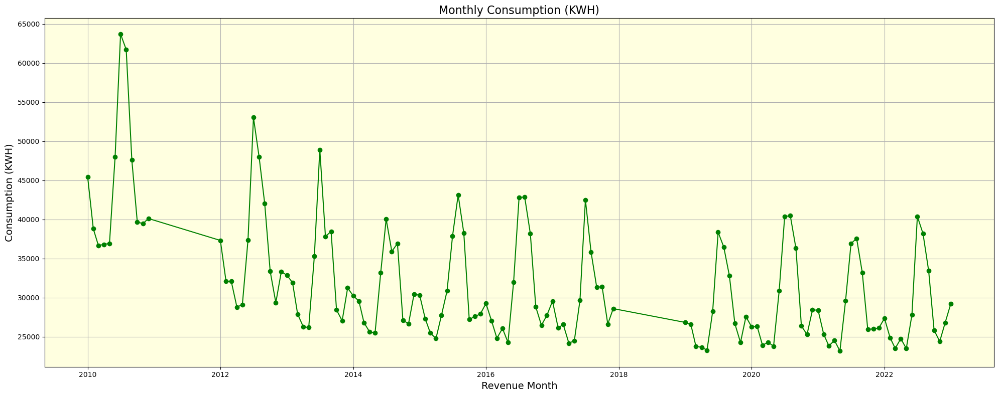

In [18]:
fig, ax = plt.subplots(figsize=(20,8))

# Plot 'Consumption (KWH)' over 'Revenue Month' using the monthly data
ax.plot(data_month['ds'], data_month['y'], marker='o', linestyle='-', color='green')
ax.set_title('Monthly Consumption (KWH)', fontsize=16)
ax.set_xlabel('Revenue Month', fontsize=14)
ax.set_ylabel('Consumption (KWH)', fontsize=14)
ax.grid(True)

# Change the background color
ax.set_facecolor('lightyellow')

plt.tight_layout()
plt.show()


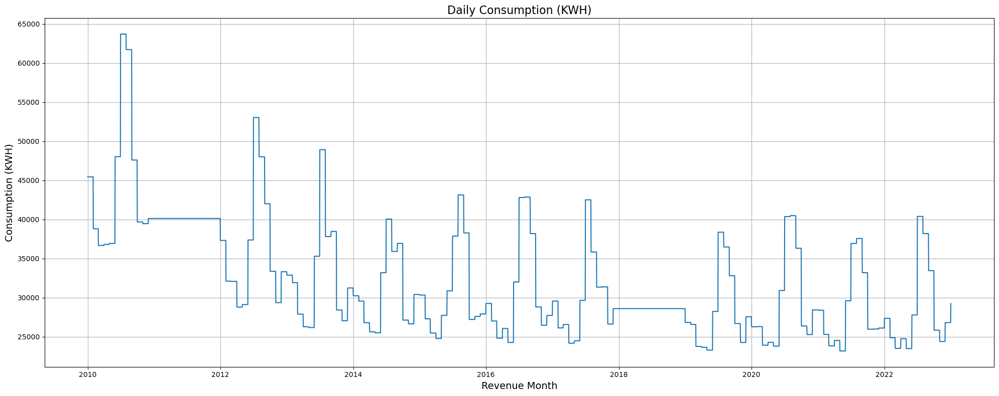

In [19]:
fig, ax = plt.subplots(figsize=(20,8))

# Plot 'Consumption (KWH)' over 'Revenue Month' using the daily data
ax.plot(data_day['ds'], data_day['y'], marker='', linestyle='-')
ax.set_title('Daily Consumption (KWH)', fontsize=16)
ax.set_xlabel('Revenue Month', fontsize=14)
ax.set_ylabel('Consumption (KWH)', fontsize=14)
ax.grid(True)

plt.tight_layout()
plt.show()


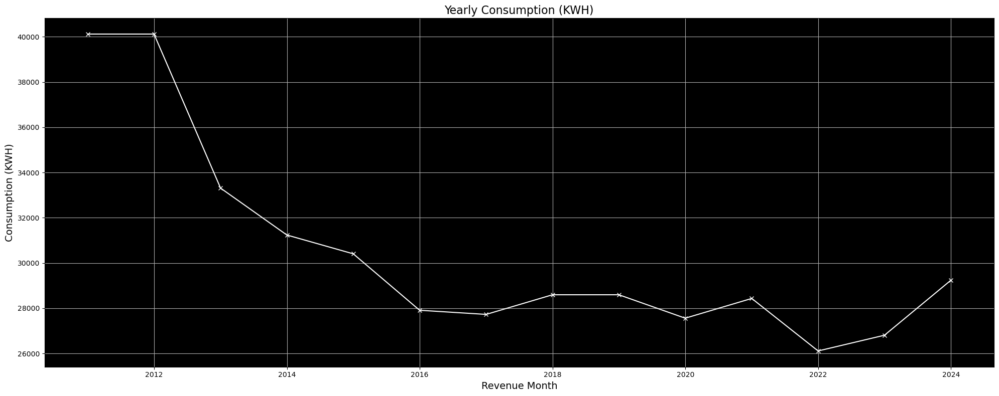

In [20]:
fig, ax = plt.subplots(figsize=(20,8))

# Plot 'Consumption (KWH)' over 'Revenue Month' using the yearly data
ax.plot(data_year['ds'], data_year['y'], marker='x', linestyle='-', color='white')
ax.set_title('Yearly Consumption (KWH)', fontsize=16)
ax.set_xlabel('Revenue Month', fontsize=14)
ax.set_ylabel('Consumption (KWH)', fontsize=14)
ax.grid(True)

# Change the background color
ax.set_facecolor('black') 

plt.tight_layout()
plt.show()

In [21]:
# Create a new DataFrame df_1 with 'Revenue Month' and 'Consumption (KWH)'
df_1 = df[['Revenue Month', 'Consumption (KWH)']]

In [22]:
# Rename the columns of df_1 as per Prophet's requirements
df_1 = df_1.copy()
df_1.rename(columns=r_dict, inplace=True)

In [23]:
# Set 'ds' as index of df_1
df_1 = df_1.set_index('ds')

In [24]:
# Display the df_1 DataFrame
df_1

,y
ds,
2010-01-01,128800.0
2010-02-01,115200.0
2010-03-01,103200.0
2010-04-01,105600.0
2010-05-01,97600.0
...,...
2023-01-01,0.0
2023-01-01,0.0
2023-01-01,82800.0


In [25]:
# Group df_1 by month and calculate the mean of 'y' for each month
df_m = df_1.groupby(pd.Grouper(freq='M')).mean()
df_m

,y
ds,
2010-01-31,45446.030782
2010-02-28,38808.144583
2010-03-31,36667.210941
2010-04-30,36808.514463
2010-05-31,36933.632880
...,...
2022-09-30,33448.128492
2022-10-31,25837.228076
2022-11-30,24391.869086


# FBProphet Modelling

## Task - 2 Then, train your model (on the respective dataset) and predict the Electric Consumption (EC) values from the last date of the dataset into X units of time into the future.

### Part b - Should the unit of time be month, then predict the EC for 1/6/9 months into the future.

In [26]:
data_month

,ds,y
0,2010-01-01,45446.030782
1,2010-02-01,38808.144583
2,2010-03-01,36667.210941
3,2010-04-01,36808.514463
4,2010-05-01,36933.632880
...,...,...
128,2022-09-01,33448.128492
129,2022-10-01,25837.228076
130,2022-11-01,24391.869086
131,2022-12-01,26805.697501


In [27]:
# Split the data into train and test sets
train_month = data_month.iloc[:85]
test_month = data_month.iloc[85:]
train_month

,ds,y
0,2010-01-01,45446.030782
1,2010-02-01,38808.144583
2,2010-03-01,36667.210941
3,2010-04-01,36808.514463
4,2010-05-01,36933.632880
...,...,...
80,2017-09-01,31344.011420
81,2017-10-01,31377.492887
82,2017-11-01,26616.702703
83,2017-12-01,28594.297671


In [28]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [29]:
# Create and fit the Prophet model on the train data
model_month = Prophet()
model_month.fit(train_month)

# Predict for 1, 6, and 9 months
future_months = [1, 6, 9]

for months in future_months:
    future_month = model_month.make_future_dataframe(periods=months, freq='M')
    forecast_m = model_month.predict(future_month)

    print(f"Forecast for {months} months:")
    print(forecast_m[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10))
    print("\n")

    pred = forecast_m.iloc[-months:]['yhat']
    true_values = test_month['y'].head(months).values

    # Evaluation metrics
    mae = mean_absolute_error(true_values, pred)
    mape = mean_absolute_percentage_error(true_values, pred)
    rmse = np.sqrt(np.mean((true_values - pred) ** 2))
    mean_value = true_values.mean()

    print(f"Evaluation Metrics for {months} months forecast:")
    print(f"MAE: {mae}")
    print(f"MAPE: {mape}")
    print(f"RMSE: {rmse}")
    print(f"Mean Value: {mean_value}")
    print("\n")
    
    # Plotting the forecast
    fig = plot_plotly(model_month, forecast_m)
    fig.update_layout(title=f"Forecast plot for {months} months")
    fig.show()

    # Plotting the forecast components
    fig = plot_components_plotly(model_month, forecast_m)
    fig.update_layout(title=f"Forecast components plot for {months} months")
    fig.show()

13:20:55 - cmdstanpy - INFO - Chain [1] start processing
13:20:56 - cmdstanpy - INFO - Chain [1] done processing


Forecast for 1 months:
           ds          yhat    yhat_lower    yhat_upper
76 2017-05-01  23339.750215  20642.978221  26093.225825
77 2017-06-01  31149.118703  28442.389674  33706.928682
78 2017-07-01  43555.761562  41005.617436  46219.506940
79 2017-08-01  39672.494284  36844.430845  42217.585634
80 2017-09-01  35264.777299  32676.875079  37739.543905
81 2017-10-01  27444.976179  24823.688407  30049.876307
82 2017-11-01  25336.632588  22528.728578  28009.745202
83 2017-12-01  27941.787906  25275.529031  30826.766690
84 2019-01-01  27844.178119  25084.069345  30691.390835
85 2019-01-31  23049.151298  20363.188988  25757.200178


Evaluation Metrics for 1 months forecast:
MAE: 3517.933700213791
MAPE: 13.241700022504451
RMSE: 3517.933700213791
Mean Value: 26567.084998414208




Forecast for 6 months:
           ds          yhat    yhat_lower    yhat_upper
81 2017-10-01  27444.976179  24464.766876  29954.982536
82 2017-11-01  25336.632588  22714.963162  28020.002907
83 2017-12-01  27941.787906  25142.921764  30677.140144
84 2019-01-01  27844.178119  25225.349826  30582.951457
85 2019-01-31  23049.151298  20325.167046  25601.727234
86 2019-02-28  22174.487951  19540.049118  24852.849643
87 2019-03-31  22614.132565  19877.654973  25272.515632
88 2019-04-30  28098.446102  25312.752448  30664.907656
89 2019-05-31  30976.100160  28449.563101  33534.919978
90 2019-06-30  33102.841557  30466.350352  35666.526951


Evaluation Metrics for 6 months forecast:
MAE: 3160.034069346381
MAPE: 11.400653810956495
RMSE: 3520.7722657656095
Mean Value: 27310.575891145545




Forecast for 9 months:
           ds          yhat    yhat_lower    yhat_upper
84 2019-01-01  27844.178119  25218.912429  30622.942837
85 2019-01-31  23049.151298  20183.402674  25501.607149
86 2019-02-28  22174.487951  19403.516466  24670.578386
87 2019-03-31  22614.132565  19826.460886  25373.903723
88 2019-04-30  28098.446102  25375.607005  30584.218881
89 2019-05-31  30976.100160  28417.988319  33576.149302
90 2019-06-30  33102.841557  30221.049694  35784.493501
91 2019-07-31  42639.042117  39951.979752  45467.429208
92 2019-08-31  35697.565988  32988.117114  38296.414452
93 2019-09-30  23472.936323  21155.775749  26223.499225


Evaluation Metrics for 9 months forecast:
MAE: 3470.0497271215986
MAPE: 11.79591198564221
RMSE: 3815.8827389436747
Mean Value: 28869.00762703957




In [30]:
# Diagnostics
model_cv = cross_validation(model=model_month, initial='2190 days', period='365 days', horizon='365 days', parallel='processes')
model_cv.tail()

13:20:59 - cmdstanpy - INFO - Chain [1] start processing
13:20:59 - cmdstanpy - INFO - Chain [1] start processing
13:20:59 - cmdstanpy - INFO - Chain [1] start processing
13:20:59 - cmdstanpy - INFO - Chain [1] done processing
13:20:59 - cmdstanpy - INFO - Chain [1] done processing
13:20:59 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
19,2017-09-01,36903.479950,34456.084855,39406.933458,31344.011420,2017-01-01
20,2017-10-01,27686.866224,25119.374666,30115.937812,31377.492887,2017-01-01
21,2017-11-01,26094.934580,23594.492863,28644.738947,26616.702703,2017-01-01
22,2017-12-01,28845.437043,26299.942892,31279.564640,28594.297671,2017-01-01
23,2019-01-01,28340.273205,25628.995511,31020.947452,26828.513038,2018-01-01


In [31]:
df_performance = performance_metrics(model_cv, rolling_window=0.1)
df_performance

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,31 days,8.455119e+06,2907.768667,2690.860185,0.100620,0.100620,0.105025,0.5
1,59 days,2.829931e+06,1682.239909,1659.969839,0.064331,0.064331,0.066508,1.0
2,90 days,1.414638e+07,3761.167727,2819.379112,0.108690,0.108690,0.120290,0.5
3,120 days,7.701056e+06,2775.077631,2215.460709,0.091191,0.091191,0.098286,0.5
4,151 days,4.535371e+06,2129.640967,2059.244763,0.067569,0.067569,0.066300,1.0
5,181 days,1.086509e+07,3296.222931,3131.564942,0.073334,0.073334,0.070485,0.5
6,212 days,2.777002e+07,5269.726294,5267.073073,0.135309,0.135309,0.133728,0.0
7,243 days,2.341538e+07,4838.943783,4774.919941,0.140928,0.140928,0.136584,0.0
8,273 days,1.151903e+07,3393.969306,3379.696769,0.112073,0.112073,0.118745,0.0
9,304 days,7.963519e+06,2821.970812,2239.191201,0.084542,0.084542,0.090676,0.5


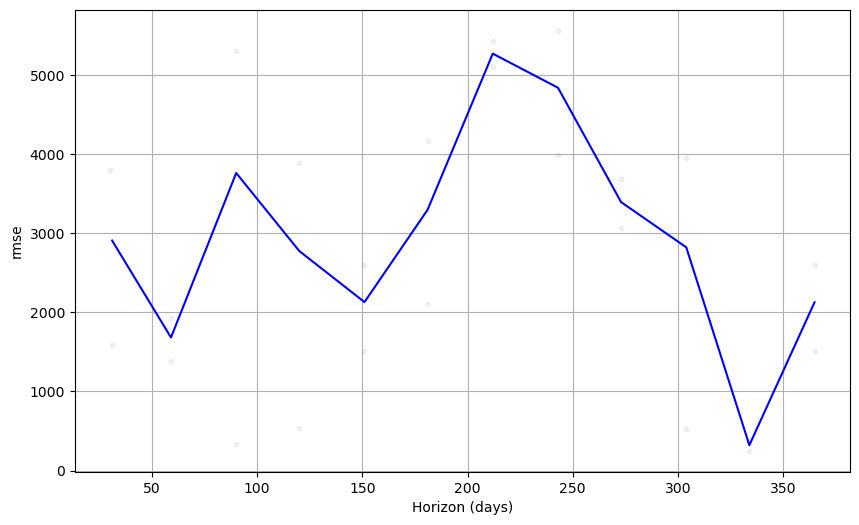

In [32]:
fig = plot_cross_validation_metric(model_cv, metric='rmse')

### Part a - Should the unit of time be day, then predict the EC for 100/200/365 days into the future.

## Day

In [33]:
data_day

,ds,y
0,2010-01-01,45446.030782
1,2010-01-02,45446.030782
2,2010-01-03,45446.030782
3,2010-01-04,45446.030782
4,2010-01-05,45446.030782
...,...,...
4744,2022-12-28,26805.697501
4745,2022-12-29,26805.697501
4746,2022-12-30,26805.697501
4747,2022-12-31,26805.697501


In [34]:
# Split the data into train and test sets
train_day = data_day.iloc[:-365]
test_day = data_day.iloc[-365:]
train_day

,ds,y
0,2010-01-01,45446.030782
1,2010-01-02,45446.030782
2,2010-01-03,45446.030782
3,2010-01-04,45446.030782
4,2010-01-05,45446.030782
...,...,...
4379,2021-12-28,26110.544916
4380,2021-12-29,26110.544916
4381,2021-12-30,26110.544916
4382,2021-12-31,26110.544916


In [35]:
# Create and fit the Prophet model on the train data
model_day = Prophet()
model_day.fit(train_day)

# Predict for 100, 200, and 365 days
future_days = [100, 200, 365]

for days in future_days:
    future_day = model_day.make_future_dataframe(periods=days)
    forecast_d = model_day.predict(future_day)

    print(f"Forecast for {days} days:")
    print(forecast_d[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(366))
    print("\n")

    pred = forecast_d.iloc[-days:]['yhat']
    true_values = test_day['y'].head(days).values

    # Evaluation metrics
    mae = mean_absolute_error(true_values, pred)
    mape = mean_absolute_percentage_error(true_values, pred)
    r2 = r2_score(true_values, pred)
    rmse = np.sqrt(np.mean((true_values - pred) ** 2))
    mean_value = true_values.mean()

    print(f"Evaluation Metrics for {days} days forecast:")
    print(f"MAE: {mae}")
    print(f"MAPE: {mape}")
    print(f"R^2: {r2}")
    print(f"RMSE: {rmse}")
    print(f"Mean Value: {mean_value}")
    print("\n")

    # Plotting the forecast
    fig = plot_plotly(model_day, forecast_d)
    fig.update_layout(title=f"Forecast plot for {days} days")
    fig.show()

    # Plotting the forecast components
    fig = plot_components_plotly(model_day, forecast_d)
    fig.update_layout(title=f"Forecast components plot for {days} days")
    fig.show()

13:20:59 - cmdstanpy - INFO - Chain [1] start processing
13:21:00 - cmdstanpy - INFO - Chain [1] done processing


Forecast for 100 days:
             ds          yhat    yhat_lower    yhat_upper
4118 2021-04-11  23409.883841  19302.469561  27132.298266
4119 2021-04-12  23456.257076  19822.586294  27389.111149
4120 2021-04-13  23478.376825  19836.300600  27349.723638
4121 2021-04-14  23494.084845  19706.808301  26842.520883
4122 2021-04-15  23540.949615  19251.611684  27419.709601
...         ...           ...           ...           ...
4479 2022-04-07  23639.067374  20075.688606  27399.837821
4480 2022-04-08  23587.267655  19804.046105  27012.845843
4481 2022-04-09  23584.926674  19985.944783  27400.277398
4482 2022-04-10  23595.006896  19856.388407  27382.287477
4483 2022-04-11  23621.577270  19694.228074  27482.951132

[366 rows x 4 columns]


Evaluation Metrics for 100 days forecast:
MAE: 905.8803611256118
MAPE: 3.6426632113402713
R^2: 0.5975881778366623
RMSE: 967.0610661009451
Mean Value: 25181.508089402505




Forecast for 200 days:
             ds          yhat    yhat_lower    yhat_upper
4218 2021-07-20  40009.770338  36494.765727  43877.939130
4219 2021-07-21  39826.253290  35974.734508  43357.211015
4220 2021-07-22  39632.891766  35773.738725  43359.431638
4221 2021-07-23  39425.269209  35666.698659  43034.690780
4222 2021-07-24  39236.272996  35484.351802  42913.457731
...         ...           ...           ...           ...
4579 2022-07-16  40355.995013  36679.246372  44069.854470
4580 2022-07-17  40409.506244  36676.905947  44108.324201
4581 2022-07-18  40415.124560  36593.713161  44063.968936
4582 2022-07-19  40336.371044  36580.573444  44176.440207
4583 2022-07-20  40196.566046  36173.502583  43934.237913

[366 rows x 4 columns]


Evaluation Metrics for 200 days forecast:
MAE: 1204.3741574636026
MAPE: 4.443202821187144
R^2: 0.8790500914963537
RMSE: 1674.4207155101224
Mean Value: 26787.90574497262




Forecast for 365 days:
             ds          yhat    yhat_lower    yhat_upper
4383 2022-01-01  27527.421865  23623.385315  31105.872495
4384 2022-01-02  27637.604406  24229.985275  31204.481034
4385 2022-01-03  27756.398478  24119.255985  31687.447458
4386 2022-01-04  27840.740044  24378.017058  31586.396275
4387 2022-01-05  27906.391975  24224.980158  31409.379063
...         ...           ...           ...           ...
4744 2022-12-28  27495.925468  23410.916589  31427.578863
4745 2022-12-29  27505.180712  23453.167089  31529.639671
4746 2022-12-30  27539.875305  23581.668334  31580.166763
4747 2022-12-31  27625.302962  23673.656494  31910.209665
4748 2023-01-01  27721.559761  23786.813063  31588.595570

[366 rows x 4 columns]


Evaluation Metrics for 365 days forecast:
MAE: 1229.285867747113
MAPE: 4.436541328946359
R^2: 0.9169656937874425
RMSE: 1598.826275745228
Mean Value: 28444.11271615557




In [36]:
# Diagnostics
model_cv = cross_validation(model=model_day, initial='2190 days', period='365 days', horizon='365 days', parallel='processes')
model_cv.tail()

13:21:05 - cmdstanpy - INFO - Chain [1] start processing
13:21:05 - cmdstanpy - INFO - Chain [1] start processing
13:21:05 - cmdstanpy - INFO - Chain [1] start processing
13:21:05 - cmdstanpy - INFO - Chain [1] start processing
13:21:05 - cmdstanpy - INFO - Chain [1] start processing
13:21:05 - cmdstanpy - INFO - Chain [1] start processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
2185,2021-12-28,29264.374889,25404.893073,33372.649951,26110.544916,2021-01-01
2186,2021-12-29,29258.406177,25318.380417,33274.763398,26110.544916,2021-01-01
2187,2021-12-30,29268.292550,25080.286094,33342.608766,26110.544916,2021-01-01
2188,2021-12-31,29329.634473,25358.535373,33401.774559,26110.544916,2021-01-01
2189,2022-01-01,29429.858224,25231.831067,33270.184552,27350.974828,2021-01-01


In [37]:
# Compute performance metrics for the cross-validation results
df_performance = performance_metrics(model_cv, rolling_window=0.1)
df_performance

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,1.085750e+06,1041.993212,876.576360,0.031787,0.027725,0.031733,1.000000
1,38 days,1.167012e+06,1080.283267,915.925896,0.033282,0.028478,0.033238,1.000000
2,39 days,1.245908e+06,1116.202331,953.276046,0.034704,0.029832,0.034673,1.000000
3,40 days,1.322355e+06,1149.937148,987.871419,0.036027,0.031161,0.036010,1.000000
4,41 days,1.397937e+06,1182.343738,1019.909619,0.037261,0.031882,0.037261,1.000000
...,...,...,...,...,...,...,...,...
324,361 days,5.295547e+06,2301.205498,2100.176864,0.076642,0.074400,0.076407,0.986301
325,362 days,5.351772e+06,2313.389762,2117.308741,0.077205,0.074400,0.076931,0.986301
326,363 days,5.416121e+06,2327.256024,2135.291285,0.077799,0.074478,0.077494,0.986301
327,364 days,5.435081e+06,2331.326084,2134.900183,0.077743,0.074827,0.077406,0.986301


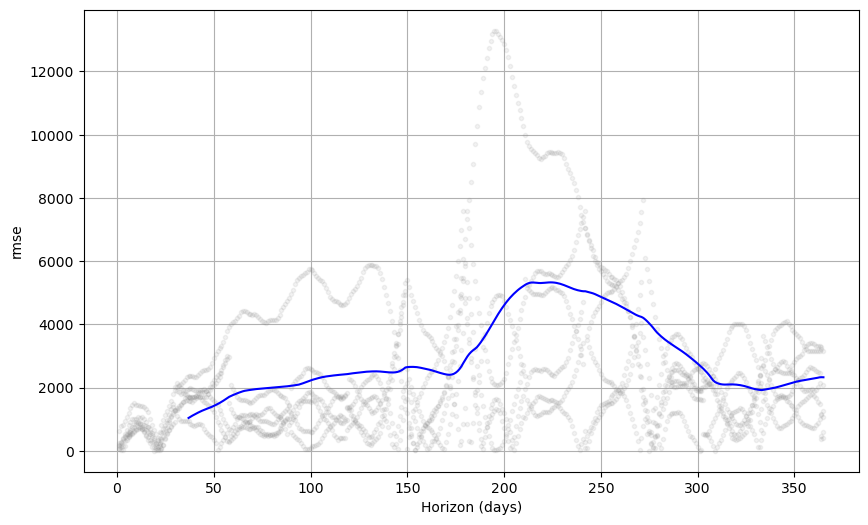

In [38]:
# Plot the RMSE metric from the cross-validation results
fig = plot_cross_validation_metric(model_cv, metric='rmse')

### Part c - Should the unit of time be year, then predict the EC for 1/10/20 years into the future.

## Year

In [39]:
data_year

,ds,y
0,2010-12-31,40121.199113
1,2011-12-31,40121.199113
2,2012-12-31,33311.049366
3,2013-12-31,31235.686828
4,2014-12-31,30404.677506
5,2015-12-31,27909.219735
6,2016-12-31,27725.989676
7,2017-12-31,28594.297671
8,2018-12-31,28594.297671
9,2019-12-31,27558.740576


In [40]:
# Split the daily data into train and test sets
train_year = data_year.iloc[:10]
test_year = data_year.iloc[10:]
train_year

,ds,y
0,2010-12-31,40121.199113
1,2011-12-31,40121.199113
2,2012-12-31,33311.049366
3,2013-12-31,31235.686828
4,2014-12-31,30404.677506
5,2015-12-31,27909.219735
6,2016-12-31,27725.989676
7,2017-12-31,28594.297671
8,2018-12-31,28594.297671
9,2019-12-31,27558.740576


In [41]:
# Create and fit the Prophet model on the daily train data
model_year = Prophet()
model_year.fit(train_year)

# Predict for 1, 10, and 20 years
future_years = [1, 10, 20]

for years in future_years:
    future_year = model_year.make_future_dataframe(periods=years, freq='Y')
    forecast_y = model_year.predict(future_year)

    print(f"Forecast for {years} years:")
    print(forecast_y[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])
    print("\n")

    if years <= len(test_year):
        pred = forecast_y.iloc[-years:]['yhat']
        true_values = test_year['y'].head(years).values

        # Evaluation metrics
        mae = mean_absolute_error(true_values, pred)
        mape = mean_absolute_percentage_error(true_values, pred)
        rmse = np.sqrt(np.mean((true_values - pred) ** 2))
        mean_value = true_values.mean()

        print(f"Evaluation Metrics for {years} years forecast:")
        print(f"MAE: {mae}")
        print(f"MAPE: {mape}")
        print(f"RMSE: {rmse}")
        print(f"Mean Value: {mean_value}")
        print("\n")

    # Plotting the forecast
    fig = plot_plotly(model_year, forecast_y)
    fig.update_layout(title=f"Forecast plot for {years} years")
    fig.show()

    # Plotting the forecast components
    fig = plot_components_plotly(model_year, forecast_y)
    fig.update_layout(title=f"Forecast components plot for {years} years")
    fig.show()

13:21:07 - cmdstanpy - INFO - Chain [1] start processing
13:21:07 - cmdstanpy - INFO - Chain [1] done processing


Forecast for 1 years:
           ds          yhat    yhat_lower    yhat_upper
0  2010-12-31  38331.894700  35819.476766  40984.332179
1  2011-12-31  37773.655018  35206.138248  40465.840835
2  2012-12-31  33378.472453  30802.471694  35829.049148
3  2013-12-31  33064.168423  30643.505936  35479.297600
4  2014-12-31  32628.511441  30190.160954  35303.541732
5  2015-12-31  32070.275011  29494.154144  34680.797289
6  2016-12-31  27675.211793  25183.577628  30222.720552
7  2017-12-31  27361.025997  24751.757186  30039.616924
8  2018-12-31  26925.486679  24351.913312  29525.156696
9  2019-12-31  26367.366065  23811.182219  28911.409649
10 2020-12-31  21972.302589  19397.050506  24525.332607


Evaluation Metrics for 1 years forecast:
MAE: 6459.110900860262
MAPE: 22.718219420191836
RMSE: 6459.110900860262
Mean Value: 28431.41348973607




Forecast for 10 years:
           ds          yhat    yhat_lower    yhat_upper
0  2010-12-31  38331.894700  35564.032702  40857.121001
1  2011-12-31  37773.655018  34988.729658  40177.457410
2  2012-12-31  33378.472453  31016.383560  35966.218636
3  2013-12-31  33064.168423  30518.520185  35632.456212
4  2014-12-31  32628.511441  30068.684714  35146.910418
5  2015-12-31  32070.275011  29511.586277  34702.594402
6  2016-12-31  27675.211793  25124.740937  30288.467887
7  2017-12-31  27361.025997  24617.004301  29802.453573
8  2018-12-31  26925.486679  24266.971736  29479.618017
9  2019-12-31  26367.366065  23697.141435  29013.161044
10 2020-12-31  21972.302589  19425.406825  24474.272495
11 2021-12-31  21658.116779  19170.735761  24052.347378
12 2022-12-31  21222.577461  18582.909796  23596.509182
13 2023-12-31  20664.456846  18153.280705  23168.259754
14 2024-12-31  16269.393370  13724.628555  18974.269632
15 2025-12-31  15955.207560  13312.788691  18599.775878
16 2026-12-31  15519.6682

Forecast for 20 years:
           ds          yhat    yhat_lower    yhat_upper
0  2010-12-31  38331.894700  35671.249623  40730.446733
1  2011-12-31  37773.655018  35475.912997  40381.938820
2  2012-12-31  33378.472453  30722.404076  35837.790684
3  2013-12-31  33064.168423  30512.760842  35741.921829
4  2014-12-31  32628.511441  30033.697815  35127.592498
5  2015-12-31  32070.275011  29487.961544  34466.922768
6  2016-12-31  27675.211793  25113.421137  30314.164140
7  2017-12-31  27361.025997  24638.700539  29894.641285
8  2018-12-31  26925.486679  24355.722588  29544.084912
9  2019-12-31  26367.366065  23721.139446  28836.105388
10 2020-12-31  21972.302589  19335.738994  24500.345778
11 2021-12-31  21658.116779  18955.811805  24111.726229
12 2022-12-31  21222.577461  18849.463191  23864.235539
13 2023-12-31  20664.456846  18106.976047  23362.933539
14 2024-12-31  16269.393370  13613.447434  18710.363292
15 2025-12-31  15955.207560  13373.866828  18539.925155
16 2026-12-31  15519.6682

## Task 3 - Tune your FBProphet model on the following parameters:
### Part a - Forecasting growth: Plausible values = logistic; linear; flat https://facebook.github.io/prophet/docs/saturating_forecasts.html (For 9 months)

13:21:07 - cmdstanpy - INFO - Chain [1] start processing
13:21:07 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future and growth = linear:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25573.287487  23249.013323  28108.885286
125 2022-05-31  29337.486027  26875.436846  31806.607532
126 2022-06-30  35809.161752  33090.698872  38284.556525
127 2022-07-31  39114.883152  36513.501788  41587.311464
128 2022-08-31  33988.019601  31358.121774  36515.499646
129 2022-09-30  25802.292884  23219.780972  28435.551108
130 2022-10-31  26663.853706  24049.696044  29431.642724
131 2022-11-30  26558.069418  24059.817039  29057.285530
132 2022-12-31  25422.379529  22990.148492  27957.169078




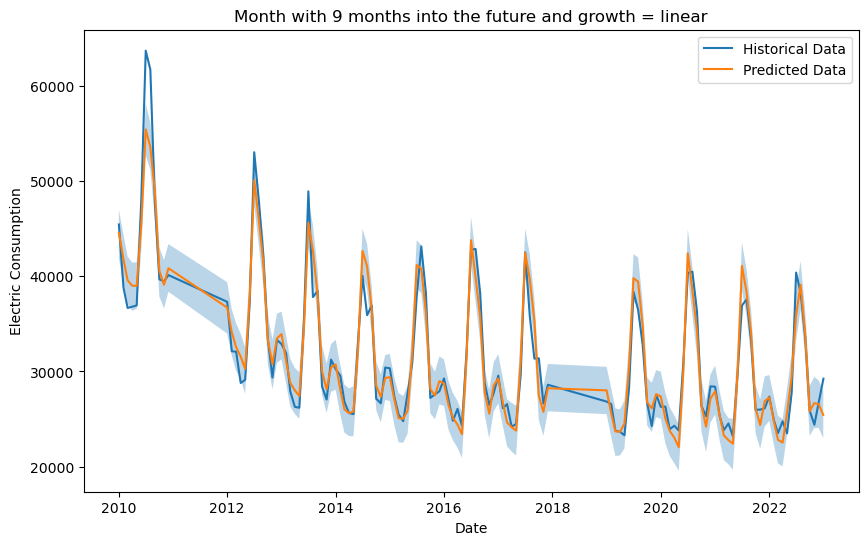

/var/folders/c9/mqzd_bl12x97763gybsmv9xc0000gn/T/ipykernel_68112/1024639256.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/c9/mqzd_bl12x97763gybsmv9xc0000gn/T/ipykernel_68112/1024639256.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

13:21:07 - cmdstanpy - INFO - Chain [1] start processing
13:21:07 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future and growth = logistic:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  24875.289428  22043.436433  27592.512491
125 2022-05-31  28544.437277  25637.662897  31524.982559
126 2022-06-30  35898.251659  32825.124240  38935.971656
127 2022-07-31  38463.302352  35726.322766  41624.984504
128 2022-08-31  33166.433859  30343.348463  36132.696137
129 2022-09-30  25120.925594  22374.427053  28078.070965
130 2022-10-31  25646.537464  23019.788614  28560.302679
131 2022-11-30  26264.444701  23147.853847  29091.301651
132 2022-12-31  25058.838866  22082.918134  27982.370682




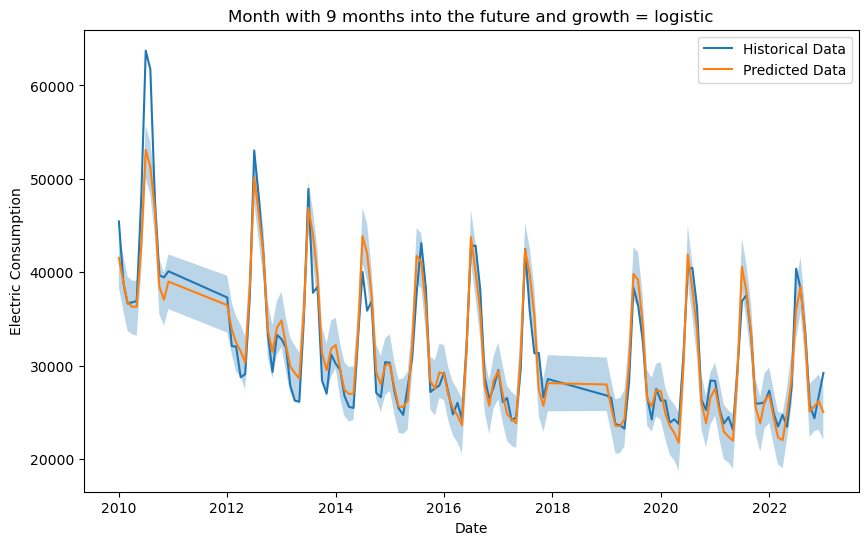

13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:08 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future and growth = flat:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  30102.847791  23910.956000  36380.997203
125 2022-05-31  33560.519763  27501.608100  40295.625033
126 2022-06-30  40120.759771  32932.930573  46544.701948
127 2022-07-31  42824.102457  36253.785610  49079.374313
128 2022-08-31  37549.918721  30656.554053  44194.411345
129 2022-09-30  29380.539018  23201.030951  35533.577159
130 2022-10-31  30302.301481  24290.174031  36774.493611
131 2022-11-30  30752.203666  24314.568400  37106.241732
132 2022-12-31  29801.411471  23272.578202  36096.938982




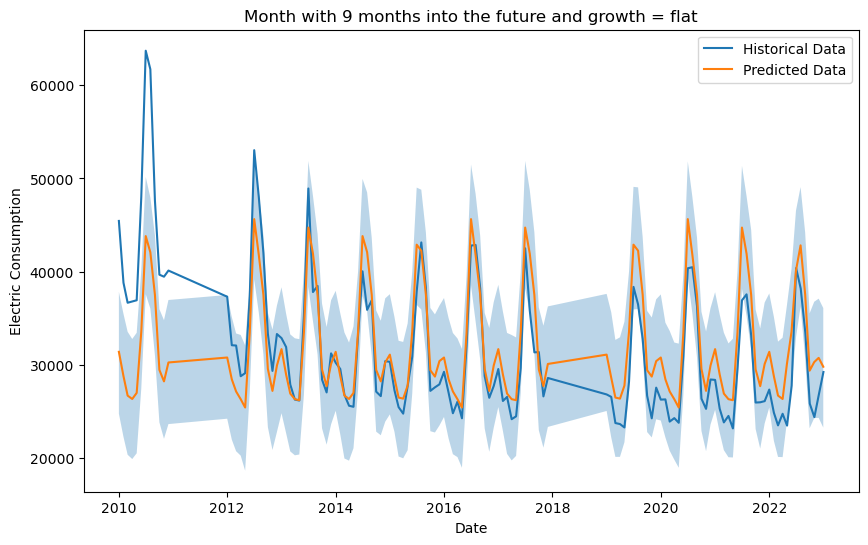

In [42]:
# Define the growth options and forecast periods
growth_options = ['linear', 'logistic', 'flat']
periods = [9]

# Iterate over the forecast periods and growth options
for period in periods:
    for growth in growth_options:
        # Split the data into train and test sets
        train = data_month.iloc[:-period]
        test = data_month.iloc[-period:]
        
        # Initialize the Prophet model with the specified growth option
        model = Prophet(growth=growth)
        
        # If the growth option is logistic, add a capacity column to the train and test data
        if growth == "logistic":
            train["cap"] = train["y"].max()
            test["cap"] = test["y"].max()

        model.fit(train)
        
        # Create a future dataframe for the specified forecast period
        future = model.make_future_dataframe(periods=period, freq='M')
        
        # If the growth option is logistic, add a capacity column to the future dataframe
        if growth == "logistic":
            future["cap"] = train["cap"].max()

        forecast = model.predict(future)
        pred = forecast.iloc[-period:]['yhat']
        true_values = test['y'].values

        # Print the predicted values in a tabular format
        print(f"Predicted values for month with {period} months into the future and growth = {growth}:")
        print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(period))
        print("\n")

        # Draw a line graph showing both historical data and the future
        plt.figure(figsize=(10, 6))
        plt.plot(data_month['ds'], data_month['y'], label='Historical Data')
        plt.plot(future['ds'], forecast['yhat'], label='Predicted Data')
        plt.fill_between(future['ds'], forecast['yhat_lower'], forecast['yhat_upper'], alpha=0.3)
        plt.title(f"Month with {period} months into the future and growth = {growth}")
        plt.xlabel('Date')
        plt.ylabel('Electric Consumption')
        plt.legend()
        plt.show()

### Part b - Seasonality: Add manual seasonality by using the add_seasonality method. Test it with various values for ‘period’ and ‘fourier_order’. https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.htm  (For 9 months)

13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:08 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 3, and fourier_order = 5:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25745.780565  23271.255107  28177.650515
125 2022-05-31  28576.094332  26158.054914  31125.288141
126 2022-06-30  35513.323464  32925.885286  38078.021233
127 2022-07-31  39111.182927  36384.262710  41666.428477
128 2022-08-31  34544.869560  31946.143881  37007.764621
129 2022-09-30  26358.443167  23837.977014  28958.166168
130 2022-10-31  25883.314371  23040.117322  28106.562387
131 2022-11-30  26037.580642  23419.662577  28483.491271
132 2022-12-31  25572.451225  22907.810979  28014.829925




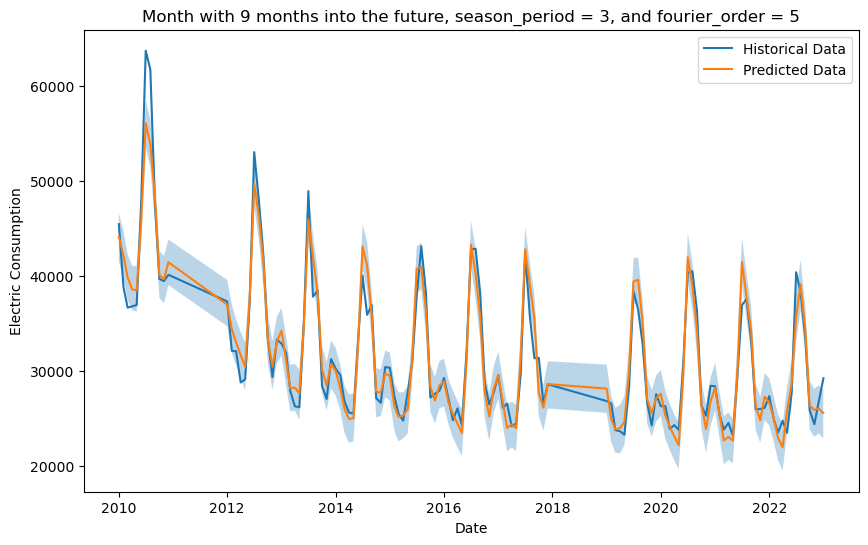

13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:08 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 3, and fourier_order = 10:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25454.959260  23028.499481  27872.351779
125 2022-05-31  28653.557604  26136.839635  31163.626713
126 2022-06-30  35874.768726  33422.499394  38184.163080
127 2022-07-31  38986.387571  36805.540243  41574.402635
128 2022-08-31  34406.281982  31902.506765  36787.890954
129 2022-09-30  26284.129509  23705.747297  28789.051584
130 2022-10-31  25737.033589  23216.504194  28067.511381
131 2022-11-30  26062.835836  23505.999644  28435.477369
132 2022-12-31  25679.261621  23143.871681  28075.061815




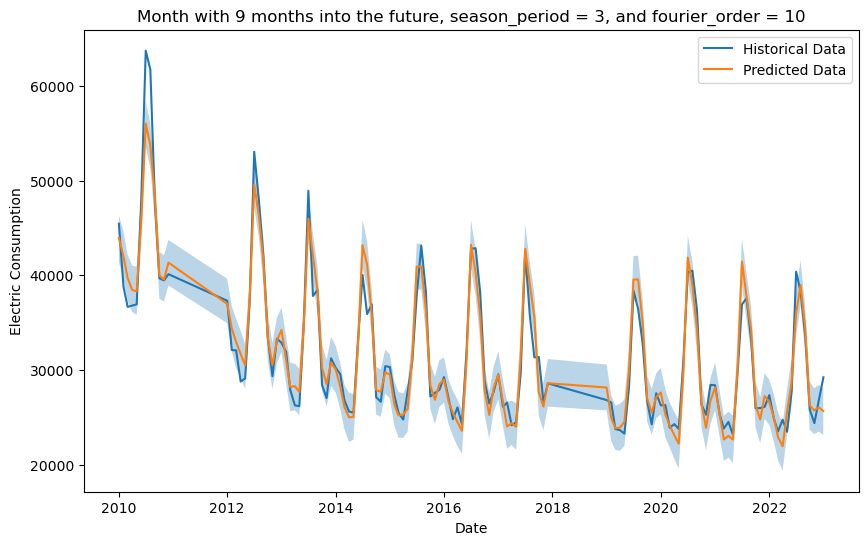

13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:08 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 3, and fourier_order = 15:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25525.093912  23057.095020  27968.320750
125 2022-05-31  28630.341643  26427.780087  31293.376133
126 2022-06-30  35832.069478  33347.508396  38412.258158
127 2022-07-31  39034.736015  36581.857446  41322.866483
128 2022-08-31  34469.740782  32002.591181  36795.284964
129 2022-09-30  26326.136493  23888.810356  28826.142837
130 2022-10-31  25768.602222  23273.751042  28168.897755
131 2022-11-30  26072.833711  23497.150389  28492.848155
132 2022-12-31  25689.338657  23424.822397  28006.656423




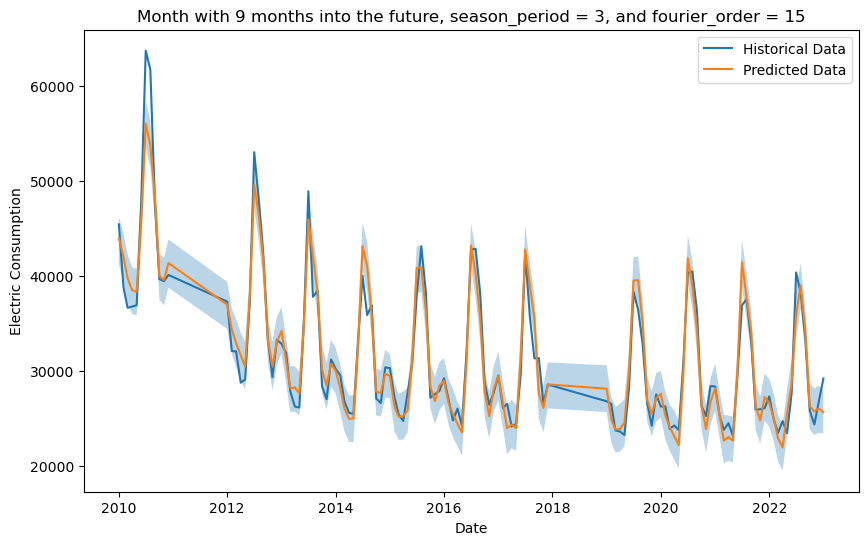

13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:08 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 6, and fourier_order = 5:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  26033.164862  23628.425825  28351.699328
125 2022-05-31  28783.381308  26217.893677  31122.953405
126 2022-06-30  35758.422417  33218.062336  38102.804485
127 2022-07-31  38827.623121  36457.083828  41393.727198
128 2022-08-31  33973.361700  31387.817657  36388.332740
129 2022-09-30  25819.549805  23476.726536  28225.452877
130 2022-10-31  25620.037389  23087.952289  28135.300919
131 2022-11-30  25948.719837  23439.579547  28406.886251
132 2022-12-31  25883.786062  23437.108018  28241.238195




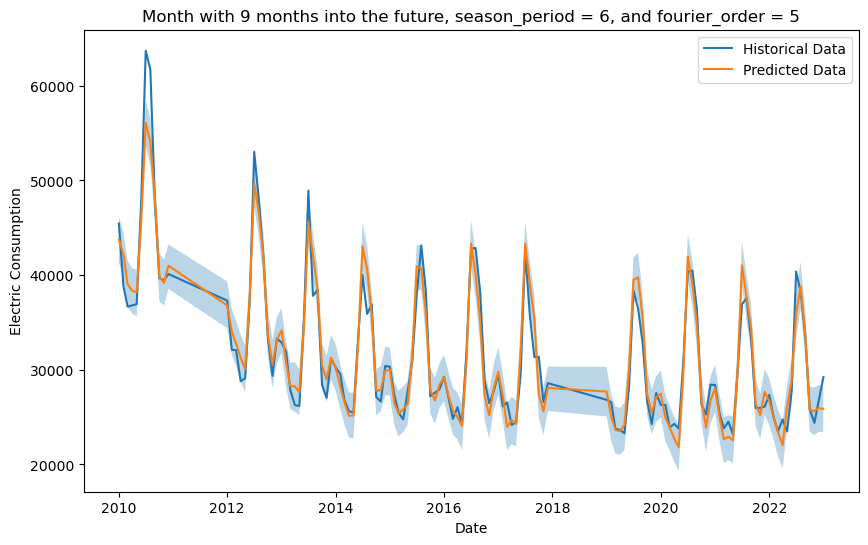

13:21:09 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 6, and fourier_order = 10:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  26317.773675  23897.571483  28953.735428
125 2022-05-31  28671.321542  26216.944722  31135.712072
126 2022-06-30  35300.216385  32911.110444  37793.702638
127 2022-07-31  38927.942540  36464.241270  41326.580408
128 2022-08-31  34092.434543  31577.072490  36450.977573
129 2022-09-30  25850.546893  23441.509104  28397.583709
130 2022-10-31  25703.719309  23285.475454  28217.334905
131 2022-11-30  25834.739035  23350.906383  28364.896787
132 2022-12-31  25709.492658  23397.979136  28294.585200




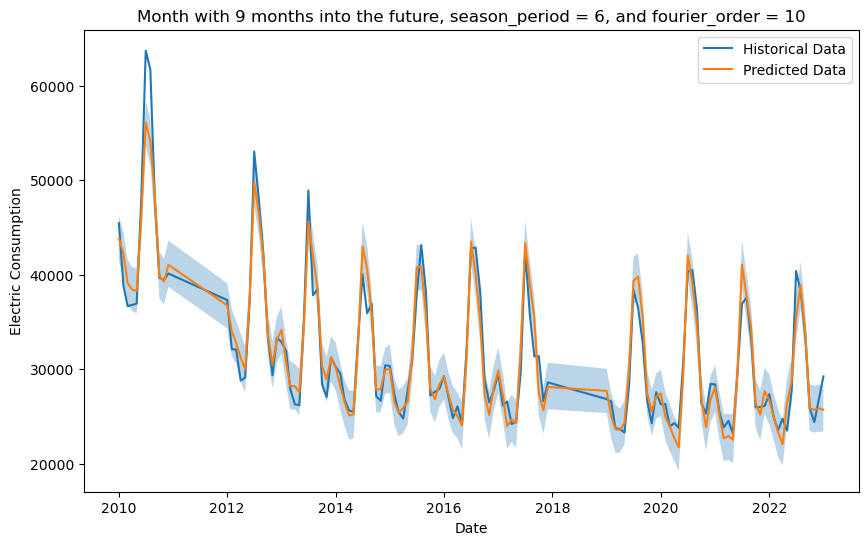

13:21:09 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 6, and fourier_order = 15:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  26142.363154  23647.053896  28388.505383
125 2022-05-31  28788.345903  26468.597210  31228.560812
126 2022-06-30  35678.169158  32982.262925  38130.863244
127 2022-07-31  38885.585583  36458.750782  41200.145744
128 2022-08-31  34032.361727  31741.900214  36537.303796
129 2022-09-30  25847.070357  23447.416200  28134.880084
130 2022-10-31  25653.040166  23214.517868  28070.524280
131 2022-11-30  25936.931032  23484.819661  28280.591053
132 2022-12-31  25885.275424  23447.412712  28387.588833




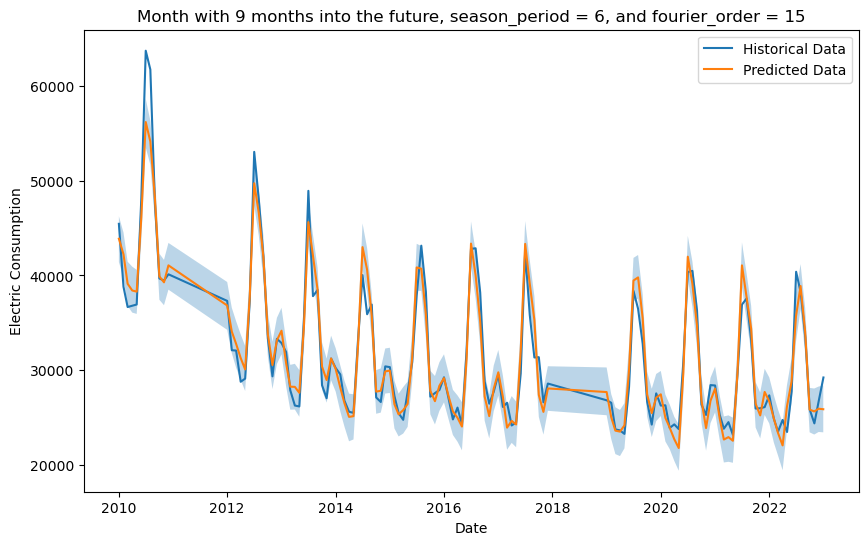

13:21:09 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 12, and fourier_order = 5:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  26435.449043  23993.095471  28838.371842
125 2022-05-31  29332.288127  26944.806929  31676.430011
126 2022-06-30  34664.153328  32244.908388  37038.158284
127 2022-07-31  39259.863578  36885.132510  41668.914451
128 2022-08-31  34013.459943  31521.741450  36462.988468
129 2022-09-30  25916.749947  23317.560634  28302.268738
130 2022-10-31  25641.615590  23341.124398  28075.328486
131 2022-11-30  25591.531403  23093.193307  27933.124259
132 2022-12-31  25939.436889  23602.056488  28435.928465




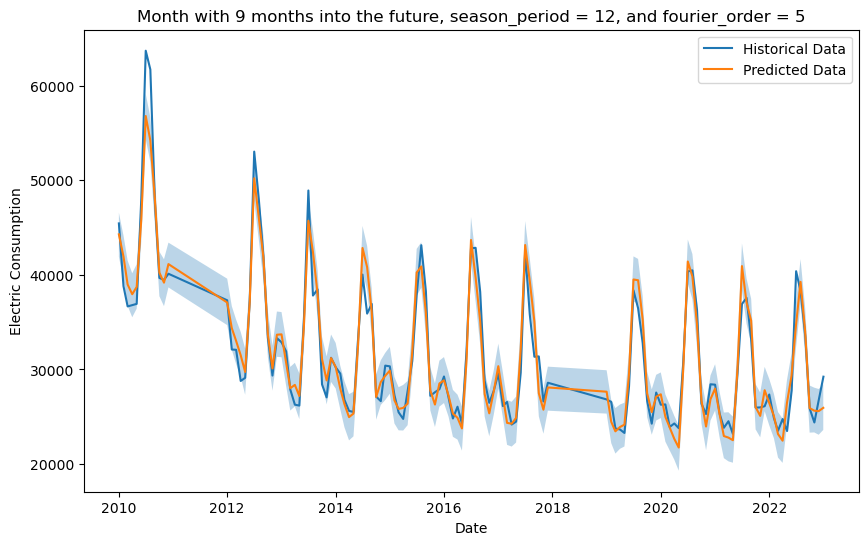

13:21:09 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 12, and fourier_order = 10:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  26076.405312  23846.172646  28626.907921
125 2022-05-31  29379.166776  26973.066038  31755.104264
126 2022-06-30  35215.994957  32805.432556  37497.950504
127 2022-07-31  39128.004580  36782.080309  41457.066006
128 2022-08-31  33883.462728  31497.821543  36137.601698
129 2022-09-30  25799.760715  23470.790264  27925.778078
130 2022-10-31  25543.813765  23208.940040  27834.467928
131 2022-11-30  25815.912359  23558.529135  28242.004008
132 2022-12-31  25975.035925  23703.094306  28172.542599




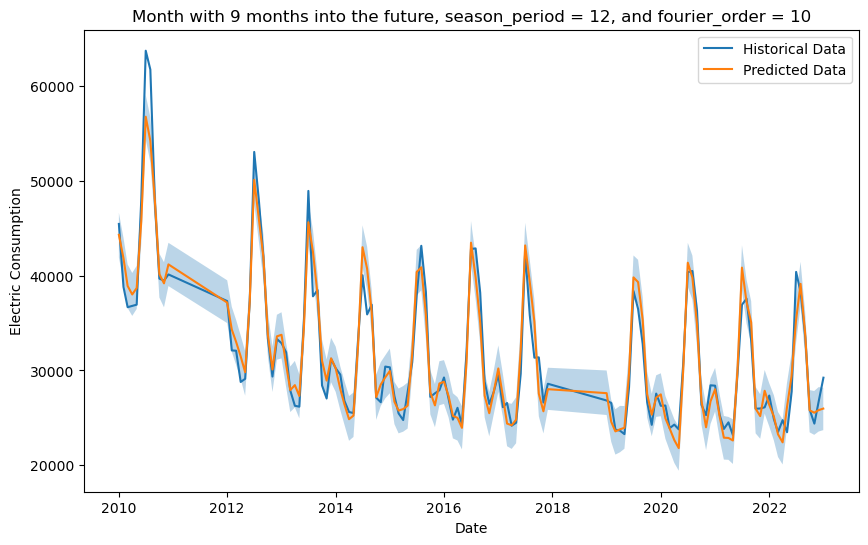

13:21:09 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, season_period = 12, and fourier_order = 15:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  26405.080376  24099.168618  28817.748473
125 2022-05-31  29299.768705  26923.823876  31807.205620
126 2022-06-30  34738.748614  32305.058541  37237.188722
127 2022-07-31  39277.082066  36939.025521  41561.761590
128 2022-08-31  33998.884343  31505.988688  36423.514599
129 2022-09-30  25883.062243  23318.921917  28284.752471
130 2022-10-31  25657.004401  23159.178729  28106.439703
131 2022-11-30  25662.524125  23141.308211  27897.487463
132 2022-12-31  25889.579742  23445.147912  28307.421083




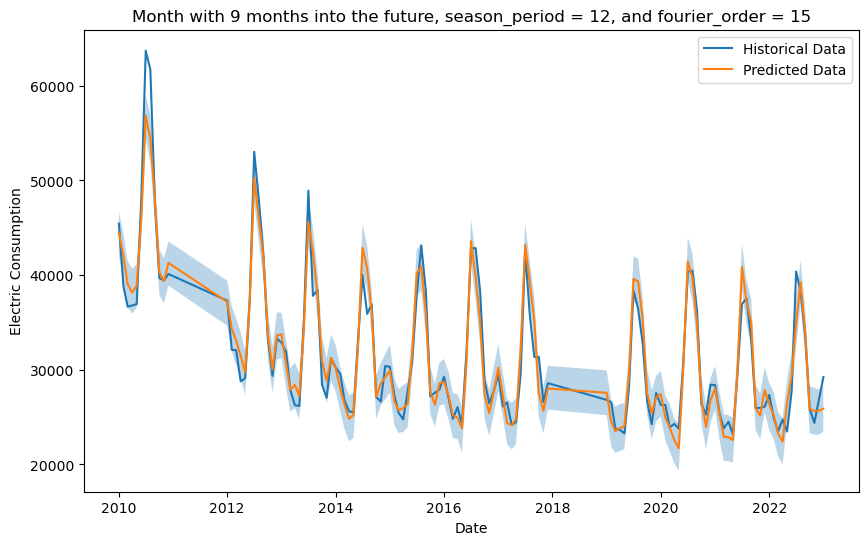

In [43]:
# Define the forecast period, period_options, and fourier_order_options
period = 9
period_options = [3, 6, 12]
fourier_order_options = [5, 10, 15]

# Iterate over the season_period and fourier_order options
for season_period in period_options:
    for fourier_order in fourier_order_options:
        train = data_month.iloc[:-period]
        test = data_month.iloc[-period:]
        
        # Initialize the Prophet model and add custom seasonality with specified season_period and fourier_order
        model = Prophet()
        model.add_seasonality(name='custom_seasonality', period=season_period, fourier_order=fourier_order)
        model.fit(train)

        future = model.make_future_dataframe(periods=period, freq='M')
        forecast = model.predict(future)
        pred = forecast.iloc[-period:]['yhat']
        true_values = test['y'].values

        # Print the predicted values in a tabular format
        print(f"Predicted values for month with {period} months into the future, season_period = {season_period}, and fourier_order = {fourier_order}:")
        print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(period))
        print("\n")

        # Draw a line graph showing both historical data and the future
        plt.figure(figsize=(10, 6))
        plt.plot(data_month['ds'], data_month['y'], label='Historical Data')
        plt.plot(future['ds'], forecast['yhat'], label='Predicted Data')
        plt.fill_between(future['ds'], forecast['yhat_lower'], forecast['yhat_upper'], alpha=0.3)
        plt.title(f"Month with {period} months into the future, season_period = {season_period}, and fourier_order = {fourier_order}")
        plt.xlabel('Date')
        plt.ylabel('Electric Consumption')
        plt.legend()
        plt.show()

### Part c - Trend Changepoints: Tune the ‘n_changepoints’ and ‘changepoit_prior_scale’ arguments/parameters https://facebook.github.io/prophet/docs/trend_changepoints.html (For 9 months)

13:21:10 - cmdstanpy - INFO - Chain [1] start processing
13:21:10 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 10, and changepoint_prior_scale = 0.01:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  20964.221737  17133.168249  24515.808700
125 2022-05-31  28240.451141  24656.527382  31764.276093
126 2022-06-30  38612.410150  35129.038208  42347.343923
127 2022-07-31  36053.811633  32405.621989  39852.859551
128 2022-08-31  31477.004135  27993.695437  35049.114161
129 2022-09-30  23848.049829  20110.443994  27441.616643
130 2022-10-31  22849.503546  19281.817168  26624.150829
131 2022-11-30  25047.169134  21595.486739  29123.704212
132 2022-12-31  25253.487355  21850.572623  28941.877388




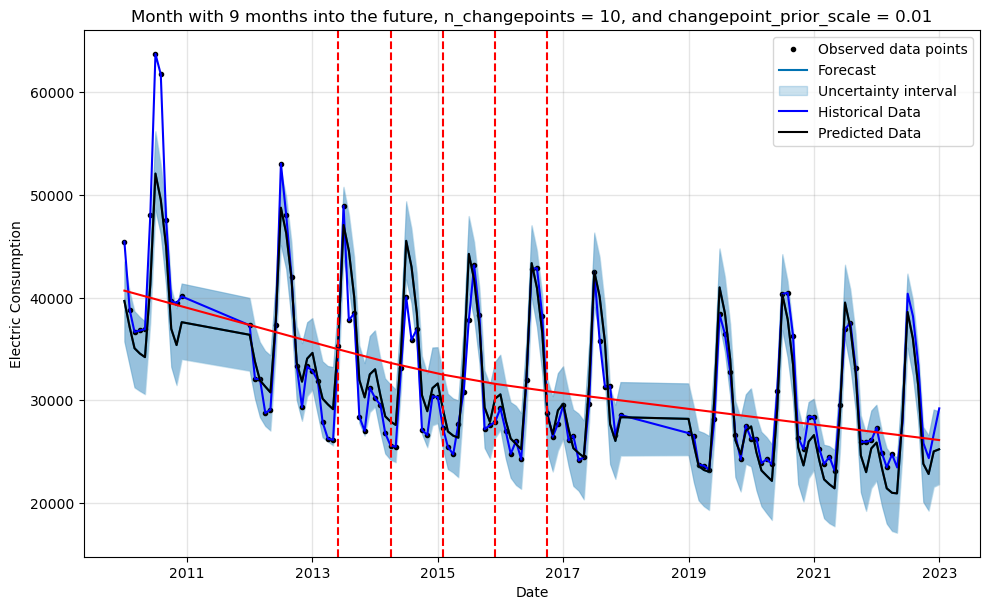

13:21:10 - cmdstanpy - INFO - Chain [1] start processing
13:21:10 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 10, and changepoint_prior_scale = 0.05:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25343.189454  22834.790159  27870.795884
125 2022-05-31  29387.674136  26793.473593  31695.417719
126 2022-06-30  36358.758661  33764.780202  38788.553556
127 2022-07-31  39076.787992  36560.967223  41447.140892
128 2022-08-31  33984.796825  31511.614572  36233.660470
129 2022-09-30  25805.817707  23291.448357  28277.895704
130 2022-10-31  26451.523727  23805.943429  28773.944999
131 2022-11-30  26641.578269  24014.622517  29246.058811
132 2022-12-31  25702.864625  23162.285168  28170.091247




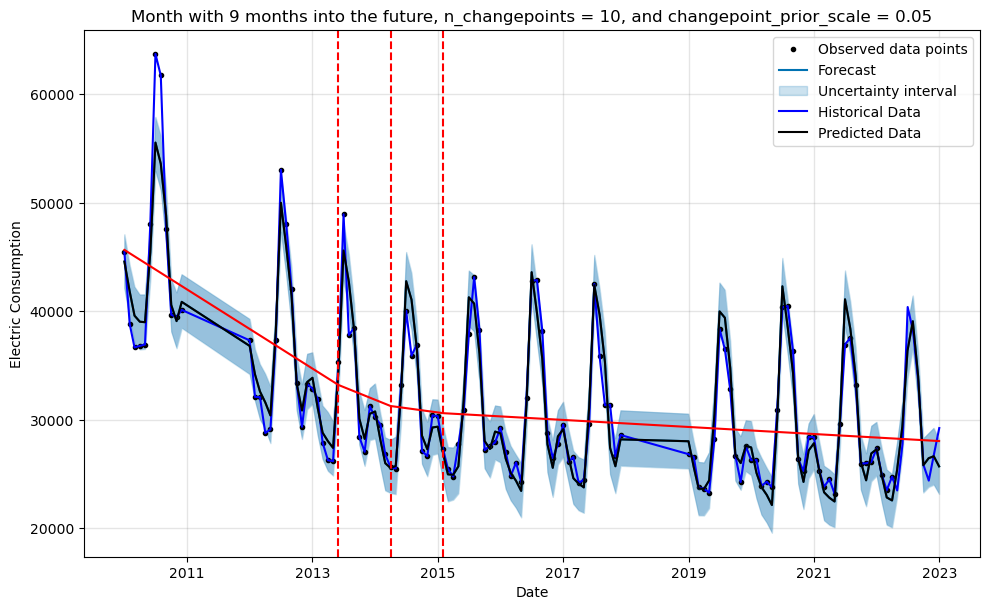

13:21:10 - cmdstanpy - INFO - Chain [1] start processing
13:21:10 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 10, and changepoint_prior_scale = 0.1:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25395.339947  22849.652487  27767.205594
125 2022-05-31  29569.460464  27118.680826  32148.851260
126 2022-06-30  36897.042881  34347.231839  39082.222445
127 2022-07-31  39301.518165  36896.365866  41777.103569
128 2022-08-31  34217.300489  31839.442044  36948.260842
129 2022-09-30  26018.557547  23568.489581  28567.069483
130 2022-10-31  26509.053653  24173.063599  29103.655288
131 2022-11-30  26883.339874  24264.564432  29160.688291
132 2022-12-31  26178.146654  23660.342097  28630.647292




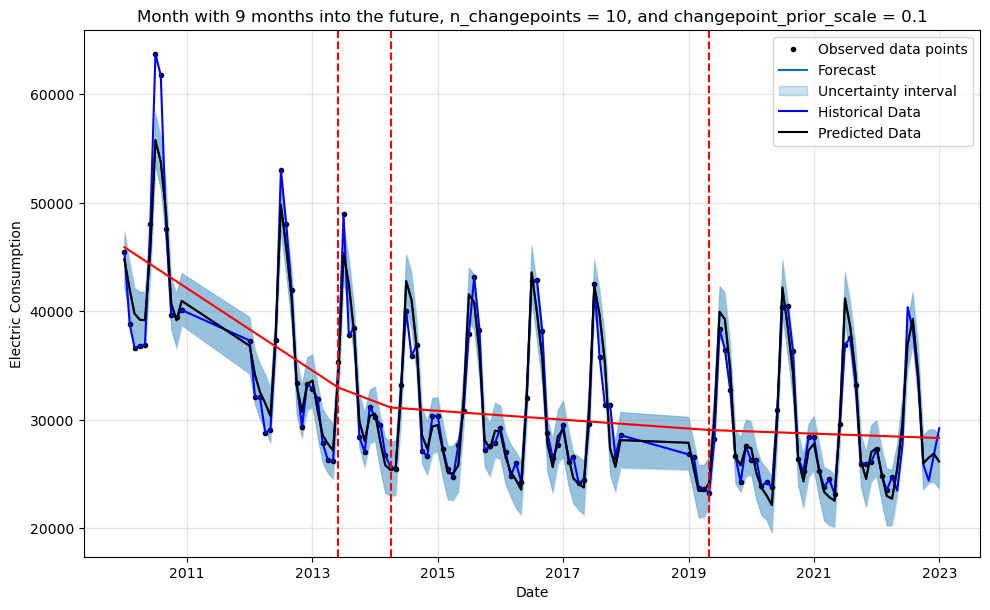

13:21:10 - cmdstanpy - INFO - Chain [1] start processing
13:21:10 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 20, and changepoint_prior_scale = 0.01:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  21286.350380  17837.223193  24762.790956
125 2022-05-31  28401.424846  25282.126505  31938.687904
126 2022-06-30  38601.482279  35131.099731  41723.856930
127 2022-07-31  36308.331308  32937.378630  39693.667939
128 2022-08-31  31714.536577  28253.271455  35170.343444
129 2022-09-30  24086.755365  20764.120488  27865.820564
130 2022-10-31  23196.308416  19698.008373  26817.013729
131 2022-11-30  25312.246594  21569.010261  28676.058122
132 2022-12-31  25400.347764  22105.328951  28719.181162




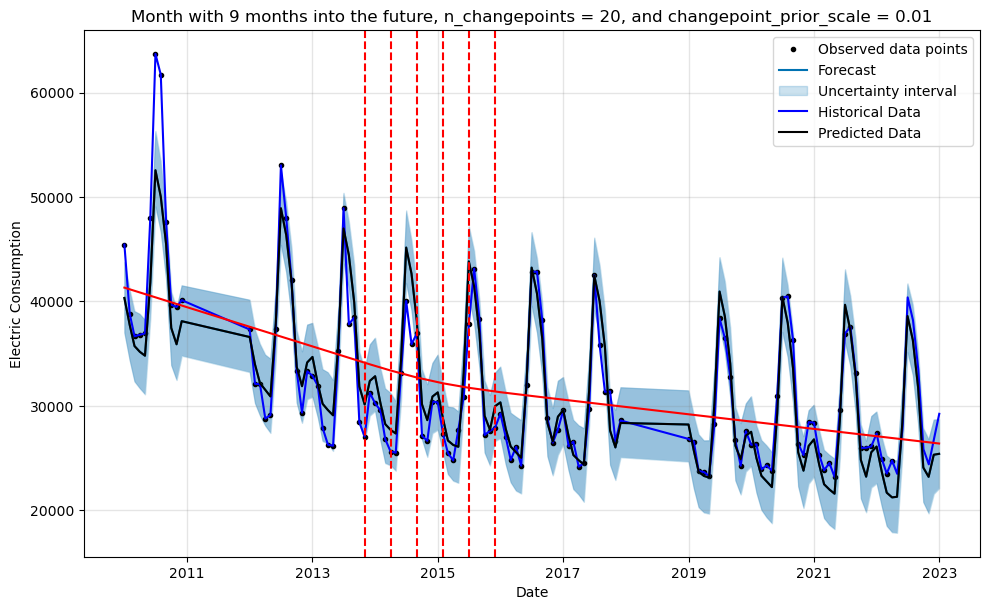

13:21:11 - cmdstanpy - INFO - Chain [1] start processing
13:21:11 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 20, and changepoint_prior_scale = 0.05:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25507.071528  23031.603169  27817.547241
125 2022-05-31  29296.245477  26600.032017  31774.367353
126 2022-06-30  35880.208752  33318.922412  38104.299052
127 2022-07-31  39080.754686  36613.668287  41596.365018
128 2022-08-31  33964.821718  31539.453897  36279.732824
129 2022-09-30  25750.177532  23290.582589  28172.330083
130 2022-10-31  26559.056629  24186.413352  29144.992630
131 2022-11-30  26516.364795  24138.550317  29041.187915
132 2022-12-31  25462.967005  22952.469951  27841.777385




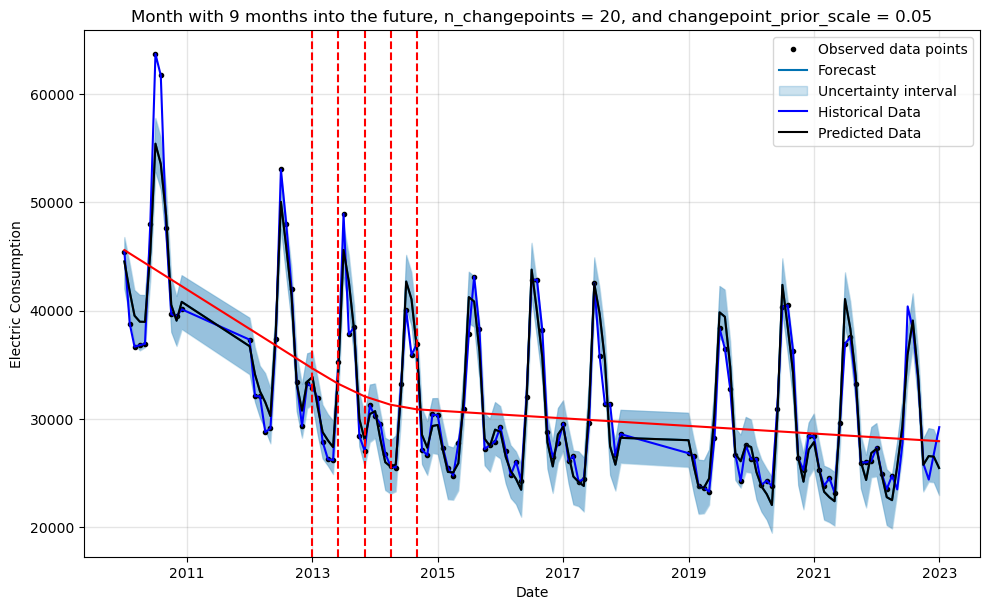

13:21:11 - cmdstanpy - INFO - Chain [1] start processing
13:21:11 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 20, and changepoint_prior_scale = 0.1:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25490.066114  23052.009932  27993.188181
125 2022-05-31  29522.763193  27027.340274  31915.596615
126 2022-06-30  36677.918648  34110.811884  39002.819443
127 2022-07-31  39331.167984  36674.377317  41823.673276
128 2022-08-31  34245.920875  31876.423833  36636.237008
129 2022-09-30  26029.136050  23353.930795  28662.882190
130 2022-10-31  26600.922744  24123.938662  29078.840014
131 2022-11-30  26869.714100  24230.682563  29440.950564
132 2022-12-31  26065.082693  23561.082421  28602.686653




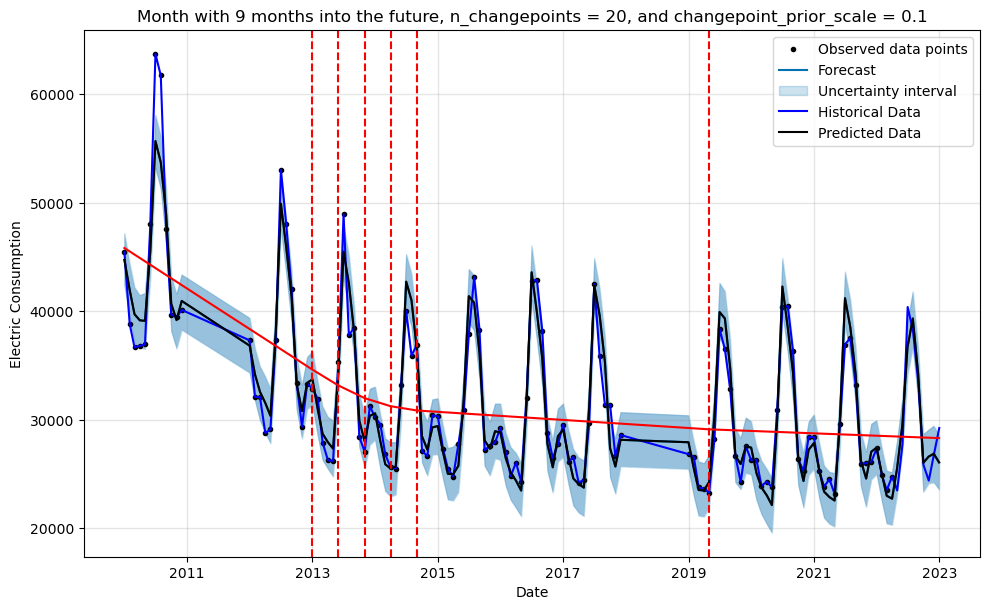

13:21:11 - cmdstanpy - INFO - Chain [1] start processing
13:21:11 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 30, and changepoint_prior_scale = 0.01:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  20950.004632  17552.477493  24531.011338
125 2022-05-31  28235.176604  24501.396986  31769.178285
126 2022-06-30  38646.521480  34965.140399  42689.297669
127 2022-07-31  36028.035241  32183.879273  39749.383785
128 2022-08-31  31447.888712  27550.721379  35212.150703
129 2022-09-30  23812.661434  20508.518131  27562.489680
130 2022-10-31  22795.804502  19200.950930  26489.707118
131 2022-11-30  25022.841533  21223.910370  28776.733452
132 2022-12-31  25245.825856  21422.366350  28844.547588




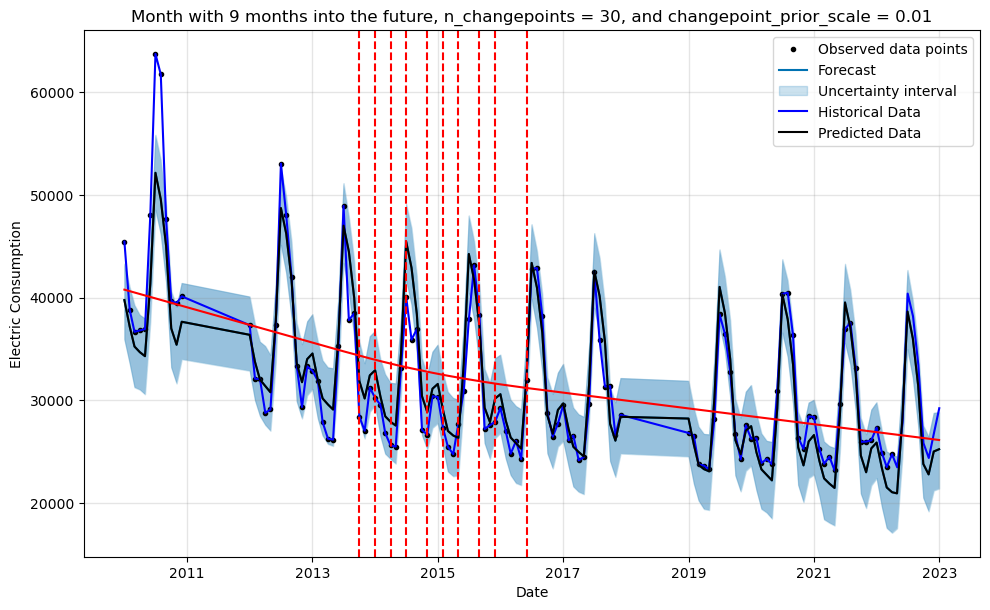

13:21:11 - cmdstanpy - INFO - Chain [1] start processing
13:21:11 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 30, and changepoint_prior_scale = 0.05:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25388.632384  22942.972227  27813.199372
125 2022-05-31  29342.234152  26824.799841  32099.146066
126 2022-06-30  36038.080428  33427.937786  38532.753602
127 2022-07-31  39005.265757  36414.647171  41575.622742
128 2022-08-31  33920.115985  31539.112491  36291.984645
129 2022-09-30  25769.360617  23208.133716  28234.318435
130 2022-10-31  26528.284809  24024.738220  29243.040231
131 2022-11-30  26552.613151  23838.092052  29062.797910
132 2022-12-31  25478.832024  22862.872196  28033.081105




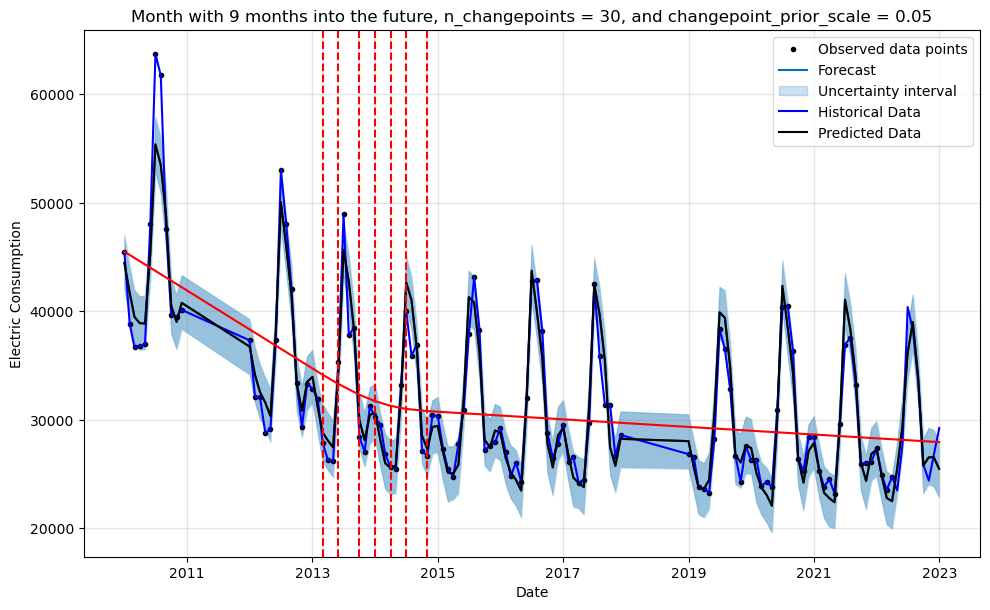

13:21:12 - cmdstanpy - INFO - Chain [1] start processing
13:21:12 - cmdstanpy - INFO - Chain [1] done processing


Predicted values for month with 9 months into the future, n_changepoints = 30, and changepoint_prior_scale = 0.1:
            ds          yhat    yhat_lower    yhat_upper
124 2022-04-30  25580.814317  22993.770689  28020.130703
125 2022-05-31  29494.052644  26709.564157  31916.420671
126 2022-06-30  36434.598552  34049.232467  39144.837756
127 2022-07-31  39328.297124  37044.299875  41793.816469
128 2022-08-31  34216.410825  31536.266895  36813.578914
129 2022-09-30  25993.113908  23731.996510  28503.997186
130 2022-10-31  26662.833938  24178.233452  29205.955196
131 2022-11-30  26804.006542  24247.225318  29494.904406
132 2022-12-31  25936.764811  23348.674893  28268.842204




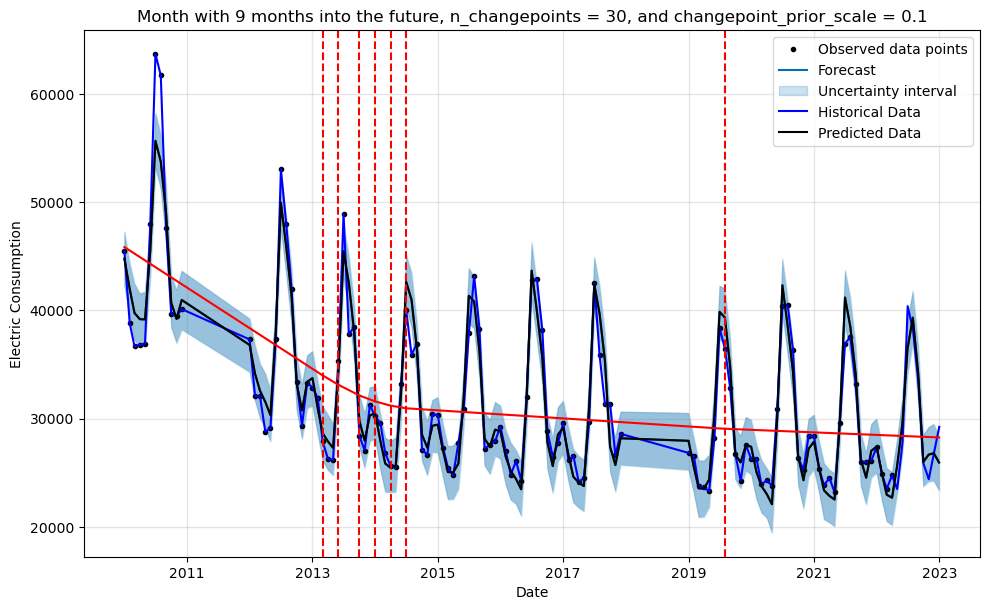

In [44]:
# Define the forecast period, n_changepoints_options, and changepoint_prior_scale_options
from prophet.plot import add_changepoints_to_plot
period = 9
n_changepoints_options = [10, 20, 30]
changepoint_prior_scale_options = [0.01, 0.05, 0.1]

# Iterate over the n_changepoints and changepoint_prior_scale options
for n_changepoints in n_changepoints_options:
    for changepoint_prior_scale in changepoint_prior_scale_options:
        train = data_month.iloc[:-period]
        test = data_month.iloc[-period:]
        
        # Initialize the Prophet model with specified n_changepoints and changepoint_prior_scale
        model = Prophet(n_changepoints=n_changepoints, changepoint_prior_scale=changepoint_prior_scale)
        model.fit(train)

        future = model.make_future_dataframe(periods=period, freq='M')
        forecast = model.predict(future)
        pred = forecast.iloc[-period:]['yhat']
        true_values = test['y'].values

        # Print the predicted values in a tabular format
        print(f"Predicted values for month with {period} months into the future, n_changepoints = {n_changepoints}, and changepoint_prior_scale = {changepoint_prior_scale}:")
        print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(period))
        print("\n")

        # Draw a line graph showing both historical data and the future
        fig = model.plot(forecast)
        plt.plot(data_month['ds'], data_month['y'], label='Historical Data', c='blue')
        plt.plot(future['ds'], forecast['yhat'], label='Predicted Data', c='black')
        plt.fill_between(future['ds'], forecast['yhat_lower'], forecast['yhat_upper'], alpha=0.3)
        plt.title(f"Month with {period} months into the future, n_changepoints = {n_changepoints}, and changepoint_prior_scale = {changepoint_prior_scale}")
        plt.xlabel('Date')
        plt.ylabel('Electric Consumption')
        plt.legend()

        # Add changepoints to the plot
        add_changepoints_to_plot(fig.gca(), model, forecast)

        plt.show()

# Extra Points: 
## Predict Electric Consumption for each of the five Boroughs

In [45]:
# Group the data by borough and revenue month, and compute the mean consumption
df_borough = df.groupby(['Borough','Revenue Month'])[['Consumption (KWH)']].mean().reset_index()
df_borough

,Borough,Revenue Month,Consumption (KWH)
0,BRONX,2010-01-01,50028.041121
1,BRONX,2010-02-01,43427.414365
2,BRONX,2010-03-01,39666.351786
3,BRONX,2010-04-01,39226.902309
4,BRONX,2010-05-01,40515.679144
...,...,...,...
868,STATEN ISLAND,2022-09-01,128995.200000
869,STATEN ISLAND,2022-10-01,97293.280000
870,STATEN ISLAND,2022-11-01,89058.560000
871,STATEN ISLAND,2022-12-01,96857.920000


In [46]:
borough = list(df_borough['Borough'].unique())
borough

['BRONX',
 'BROOKLYN',
 'FHA',
 'MANHATTAN',
 'NON DEVELOPMENT FACILITY',
 'QUEENS',
 'STATEN ISLAND']

In [47]:
# Split the data into separate dataframes for each borough
df_bor=[]
for borough, df in df_borough.groupby(['Borough']):
    df_bor.append(df)
df_bor

[    Borough Revenue Month  Consumption (KWH)
 0     BRONX    2010-01-01       50028.041121
 1     BRONX    2010-02-01       43427.414365
 2     BRONX    2010-03-01       39666.351786
 3     BRONX    2010-04-01       39226.902309
 4     BRONX    2010-05-01       40515.679144
 ..      ...           ...                ...
 128   BRONX    2022-09-01       38866.900794
 129   BRONX    2022-10-01       29832.501323
 130   BRONX    2022-11-01       28071.689655
 131   BRONX    2022-12-01       29694.406460
 132   BRONX    2023-01-01       34826.816393
 
 [133 rows x 3 columns],
       Borough Revenue Month  Consumption (KWH)
 133  BROOKLYN    2010-01-01       37531.571903
 134  BROOKLYN    2010-02-01       31871.289730
 135  BROOKLYN    2010-03-01       30244.381779
 136  BROOKLYN    2010-04-01       31023.975054
 137  BROOKLYN    2010-05-01       29442.510846
 ..        ...           ...                ...
 261  BROOKLYN    2022-09-01       26594.811229
 262  BROOKLYN    2022-10-01       21

## Bronx

In [48]:
# Prepare the data for the Bronx borough
df_bronx = df_bor[0]
df_bronx.drop('Borough', axis=1, inplace=True)
df_bronx.columns = ['ds', 'y']
df_bronx

,ds,y
0,2010-01-01,50028.041121
1,2010-02-01,43427.414365
2,2010-03-01,39666.351786
3,2010-04-01,39226.902309
4,2010-05-01,40515.679144
...,...,...
128,2022-09-01,38866.900794
129,2022-10-01,29832.501323
130,2022-11-01,28071.689655
131,2022-12-01,29694.406460


In [49]:
# Split the Bronx data into train and test sets
train_bronx = df_bronx.iloc[:85]
test_bronx = df_bronx.iloc[85:]
train_bronx

,ds,y
0,2010-01-01,50028.041121
1,2010-02-01,43427.414365
2,2010-03-01,39666.351786
3,2010-04-01,39226.902309
4,2010-05-01,40515.679144
...,...,...
80,2017-09-01,36291.865613
81,2017-10-01,38379.128388
82,2017-11-01,31849.770328
83,2017-12-01,33629.298146


In [50]:
# Create and fit the Prophet model on the Bronx train data
model_bronx = Prophet()
model_bronx.fit(train_bronx)

# Create a future dataframe for the Bronx model and make predictions
future = model_bronx.make_future_dataframe(periods=24, freq='M')
forecast_bronx = model_bronx.predict(future)

13:21:12 - cmdstanpy - INFO - Chain [1] start processing
13:21:12 - cmdstanpy - INFO - Chain [1] done processing


In [51]:
forecast_bronx[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,48243.208016,45521.307508,51164.339364
1,2010-02-01,45064.051076,41876.824412,47850.906684
2,2010-03-01,42382.949084,39464.823949,45469.277234
3,2010-04-01,41142.528207,38044.915847,44190.304683
4,2010-05-01,42216.900890,39014.257463,45313.110785
...,...,...,...,...
104,2020-08-31,42618.473121,39417.629939,45477.180894
105,2020-09-30,31346.277230,28132.697711,34285.661158
106,2020-10-31,32982.088968,30018.311965,36198.329756
107,2020-11-30,33603.188150,30620.275749,36883.226803


In [52]:
plot_plotly(model_bronx ,forecast_bronx)

## Brooklyn

In [53]:
# Prepare the data for the Brooklyn borough
df_brooklyn = df_bor[1]
df_brooklyn.drop('Borough', axis=1, inplace=True)
df_brooklyn.columns = ['ds', 'y']
df_brooklyn

,ds,y
133,2010-01-01,37531.571903
134,2010-02-01,31871.289730
135,2010-03-01,30244.381779
136,2010-04-01,31023.975054
137,2010-05-01,29442.510846
...,...,...
261,2022-09-01,26594.811229
262,2022-10-01,21011.494941
263,2022-11-01,19836.485640
264,2022-12-01,21764.163158


In [54]:
# Split the Brooklyn data into train and test sets
train_bkln = df_brooklyn.iloc[:85]
test_bkln = df_brooklyn.iloc[85:]

In [55]:
# Create and fit the Prophet model on the Brooklyn train data
model_bkln = Prophet()
model_bkln.fit(train_bkln)
future = model_bkln.make_future_dataframe(periods=24, freq='M')
forecast_bkln = model_bkln.predict(future)

13:21:12 - cmdstanpy - INFO - Chain [1] start processing
13:21:13 - cmdstanpy - INFO - Chain [1] done processing


In [56]:
forecast_bkln[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,37541.850026,34979.922814,39848.040000
1,2010-02-01,35062.099276,32538.377730,37409.106274
2,2010-03-01,33020.383364,30561.255873,35687.031013
3,2010-04-01,32196.570421,29651.578011,34667.568144
4,2010-05-01,32423.894099,29949.721746,34780.380245
...,...,...,...,...
104,2020-08-31,25631.601539,23202.931322,27904.624947
105,2020-09-30,17360.487993,14834.678008,19845.110346
106,2020-10-31,18919.700174,16606.341949,21341.674672
107,2020-11-30,18646.019091,16017.872102,21051.768864


In [57]:
plot_plotly(model_bkln ,forecast_bkln)

## Manhattan

In [58]:
# Prepare the data for the Manhattan borough
df_manhattan = df_bor[3]
df_manhattan.drop('Borough', axis=1, inplace=True)
df_manhattan.columns = ['ds', 'y']
df_manhattan

,ds,y
385,2010-01-01,49050.579200
386,2010-02-01,42323.036278
387,2010-03-01,40555.858044
388,2010-04-01,40533.979528
389,2010-05-01,41163.179528
...,...,...
513,2022-09-01,38184.802410
514,2022-10-01,28849.873341
515,2022-11-01,27362.439490
516,2022-12-01,29655.719640


In [59]:
# Split the Manhattan data into train and test sets
train_manhtn = df_manhattan.iloc[:85]
test_manhtn = df_manhattan.iloc[85:]

In [60]:
# Create and fit the Prophet model on the Manhattan train data
model_manhtn = Prophet()
model_manhtn.fit(train_manhtn)
future = model_manhtn.make_future_dataframe(periods=24, freq='M')
forecast_manhtn = model_manhtn.predict(future)

13:21:13 - cmdstanpy - INFO - Chain [1] start processing
13:21:13 - cmdstanpy - INFO - Chain [1] done processing


In [61]:
forecast_manhtn[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,48691.543962,45582.025387,51835.335788
1,2010-02-01,45662.790216,42673.580417,48850.909875
2,2010-03-01,43197.999117,40194.554526,46217.559860
3,2010-04-01,41934.069464,39116.509791,44748.837586
4,2010-05-01,43086.433066,40030.427299,46263.332106
...,...,...,...,...
104,2020-08-31,43714.893719,40787.854651,47127.681422
105,2020-09-30,31929.419930,28744.955012,35053.702952
106,2020-10-31,33719.383895,30638.305956,36999.192108
107,2020-11-30,34135.745617,30998.977399,37433.853729


In [62]:
plot_plotly(model_manhtn ,forecast_manhtn)

## Queens

In [63]:
# Prepare the data for the Queens borough
df_queens = df_bor[5]
df_queens.drop('Borough', axis=1, inplace=True)
df_queens.columns = ['ds', 'y']
df_queens

,ds,y
607,2010-01-01,41671.350877
608,2010-02-01,32817.835294
609,2010-03-01,32033.334646
610,2010-04-01,31881.952756
611,2010-05-01,33372.609848
...,...,...
735,2022-09-01,25674.500000
736,2022-10-01,18788.171687
737,2022-11-01,17981.876133
738,2022-12-01,20142.917323


In [64]:
# Split the Queens data into train and test sets
train_queens = df_queens.iloc[:85]
test_queens = df_queens.iloc[85:]

In [65]:
# Create and fit the Prophet model on the Queens train data
model_queens = Prophet()
model_queens.fit(train_queens)
future = model_queens.make_future_dataframe(periods=24, freq='M')
forecast_queens = model_queens.predict(future)

13:21:13 - cmdstanpy - INFO - Chain [1] start processing
13:21:14 - cmdstanpy - INFO - Chain [1] done processing


In [66]:
forecast_queens[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,40799.716772,38020.038639,43476.750798
1,2010-02-01,36912.385720,33989.763969,39713.925428
2,2010-03-01,35725.988819,32894.543960,38631.007888
3,2010-04-01,34679.176203,31831.955218,37331.797269
4,2010-05-01,35373.800307,32540.788857,38067.410348
...,...,...,...,...
104,2020-08-31,28458.722719,25626.757025,31304.043464
105,2020-09-30,20104.426361,17304.760538,23108.249900
106,2020-10-31,22347.852998,19416.780362,25167.083765
107,2020-11-30,23636.197282,20620.333693,26771.586787


In [67]:
plot_plotly(model_queens ,forecast_queens)

## Staten Island

In [68]:
# Prepare the data for the Staten Island borough
df_si = df_bor[6]
df_si.drop('Borough', axis=1, inplace=True)
df_si.columns = ['ds', 'y']
df_si

,ds,y
740,2010-01-01,130853.652174
741,2010-02-01,132395.400000
742,2010-03-01,117703.750000
743,2010-04-01,97643.347826
744,2010-05-01,109158.695652
...,...,...
868,2022-09-01,128995.200000
869,2022-10-01,97293.280000
870,2022-11-01,89058.560000
871,2022-12-01,96857.920000


In [69]:
# Split the Staten Island data into train and test sets
train_si = df_si.iloc[:85]
test_si = df_si.iloc[85:]

In [70]:
# Create and fit the Prophet model on the Staten Island train data
model_si = Prophet()
model_si.fit(train_si)
future = model_si.make_future_dataframe(periods=24, freq='M')
forecast_si = model_si.predict(future)

13:21:14 - cmdstanpy - INFO - Chain [1] start processing
13:21:14 - cmdstanpy - INFO - Chain [1] done processing


In [71]:
forecast_si[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,129267.304485,122098.903227,136802.208257
1,2010-02-01,124087.083504,116412.198964,131909.528070
2,2010-03-01,113964.625798,106685.687249,121389.926362
3,2010-04-01,105004.583432,96768.661356,112509.745528
4,2010-05-01,110524.320139,103084.844491,118125.920365
...,...,...,...,...
104,2020-08-31,129226.166287,121779.310541,136626.207154
105,2020-09-30,93676.034230,86095.697693,101370.289787
106,2020-10-31,98706.939699,90665.542633,106524.230890
107,2020-11-30,100056.212985,92387.448008,107627.664174


In [72]:
plot_plotly(model_si ,forecast_si)

In [73]:
boroughs = ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']

# Create a list to store the actual and predicted values
actual_values = [test_bronx['y'], test_bkln['y'], test_manhtn['y'], test_queens['y'], test_si['y']]
predictions = [forecast_bronx.iloc[-48:]['yhat'], forecast_bkln.iloc[-48:]['yhat'], forecast_manhtn.iloc[-48:]['yhat'], forecast_queens.iloc[-48:]['yhat'], forecast_si.iloc[-48:]['yhat']]

# Evaluate the models
for i, borough in enumerate(boroughs):
    mae = mean_absolute_error(actual_values[i], predictions[i])
    mape = mean_absolute_percentage_error(actual_values[i].values, predictions[i].values)
    
    print(f"{borough}:")
    print(f"  MAE: {mae}")
    print(f"  MAPE: {mape}\n")

Bronx:
  MAE: 2271.2947223148158
  MAPE: 6.886345788921043

Brooklyn:
  MAE: 2005.1296932854966
  MAPE: 8.653630448437859

Manhattan:
  MAE: 2672.3230984532106
  MAPE: 8.101719054978247

Queens:
  MAE: 3397.39446505213
  MAPE: 16.216548616713624

Staten Island:
  MAE: 7487.787033336586
  MAPE: 6.854485748033863



In [74]:
# Extract last 12 months of predictions for each borough
forecast_bronx_24 = forecast_bronx.iloc[-12:]['yhat']
forecast_bkln_24 = forecast_bkln.iloc[-12:]['yhat']
forecast_manhtn_24 = forecast_manhtn.iloc[-12:]['yhat']
forecast_queens_24 = forecast_queens.iloc[-12:]['yhat']
forecast_si_24 = forecast_si.iloc[-12:]['yhat']

# Calculate the average consumption for each borough
average_bronx = forecast_bronx_24.mean()
average_bkln = forecast_bkln_24.mean()
average_manhtn = forecast_manhtn_24.mean()
average_queens = forecast_queens_24.mean()
average_si = forecast_si_24.mean()

# Display the results
print("Average Consumption for Bronx:", average_bronx)
print("Average Consumption for Brooklyn:", average_bkln)
print("Average Consumption for Manhattan:", average_manhtn)
print("Average Consumption for Queens:", average_queens)
print("Average Consumption for Staten Island:", average_si)

Average Consumption for Bronx: 35169.57923825702
Average Consumption for Brooklyn: 20550.63272509382
Average Consumption for Manhattan: 35754.79115419022
Average Consumption for Queens: 24028.04183021269
Average Consumption for Staten Island: 106498.37709357783
